# 221226 Day85

## OpenCV
- Open Source Computer Vision Library (오픈소스 이미지(동영상) 라이브러리)

- 이미지 형식 변환, 필터처리, 얼굴인식, 물체인식, 문자인식 등 이미지와 관련된 다양한 처리

- 머신러닝에서 OpenCV 사용 : 머신러닝의 입력으로 전달하려면 이미지를 숫자 배열 데이터로 변경

- 파이썬 에서 설치 : pip install opencv-python

### (1) 이미지와 넘파이
- 이미지는 배열로 표현가능
- 웹에서 이미지 읽기(가져오기) : pillow, matplotlib, OpenCV 가능

In [ ]:
!pwd

/content


#### * url 로 이미지 가져오기
urllib.request\
urlretrieve()

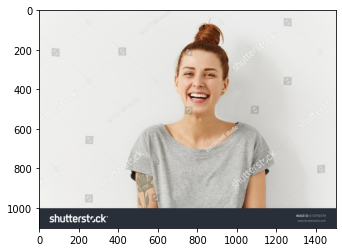

In [ ]:
# urllib.request 모듈 : 웹사이트 데이터 접근할 때
import urllib.request as req
import matplotlib.pyplot as plt
import cv2

url = 'https://image.shutterstock.com/z/stock-photo-happy-cheerful-young-woman-wearing-her-red-hair-\
in-bun-rejoicing-at-positive-news-or-birthday-gift-613759379.jpg'

# 이미지 다운로드
req.urlretrieve(url, 'lady.png')

# OpenCV 로 읽어들이기
img = cv2.imread('lady.png')

# 이미지 출력
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))   # BGR2RGB : 색깔지정 (BGR : RGB 거꾸로 한 것, 2 : to)
plt.show()

#### * matplotlib

저장되었습니다


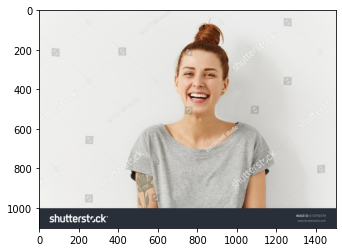

In [ ]:
import urllib.request

url = 'https://image.shutterstock.com/z/stock-photo-happy-cheerful-young-woman-wearing-her-red-hair-\
in-bun-rejoicing-at-positive-news-or-birthday-gift-613759379.jpg'

save_name = 'lady.png'

# 이미지 읽기
mem = urllib.request.urlopen(url).read()

# 이미지 다운로드 (저장)
with open(save_name, mode='wb') as f:
  f.write(mem)
  print('저장되었습니다')

# 저장한 이미지 읽기
img = cv2.imread('lady.png')

# 이미지 출력
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.show()

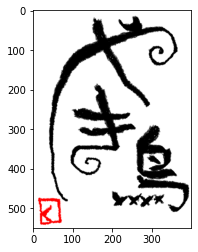

In [ ]:
url = 'http://uta.pw/shodou/img/28/214.png'

# 이미지 다운로드
req.urlretrieve(url, 'sample.png')

# OpenCV 로 읽어들이기
img = cv2.imread('sample.png')

plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))   # OpenCV 는 BGR 포맷 --> RGB 로 바꿔주어야 함
plt.show()

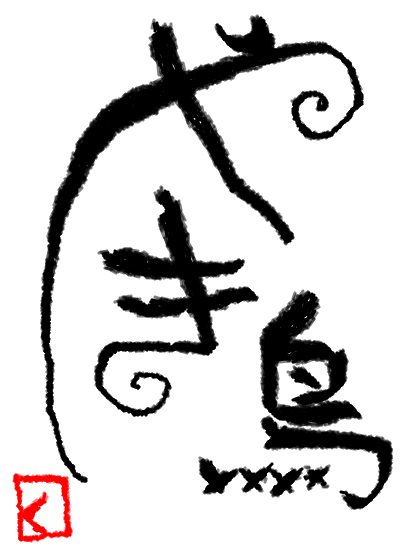

In [ ]:
# Colab 에서 OpenCV 를 사용하기 위해 cv2 를 import
# Colab 에서는 cv2_imshow() 를 사용
from google.colab.patches import cv2_imshow

img = cv2.imread('sample.png')

# OpenCV 로 이미지 출력
cv2_imshow(img)

#### * PIL (pillow) : 파이썬 이미지 처리 라이브러리

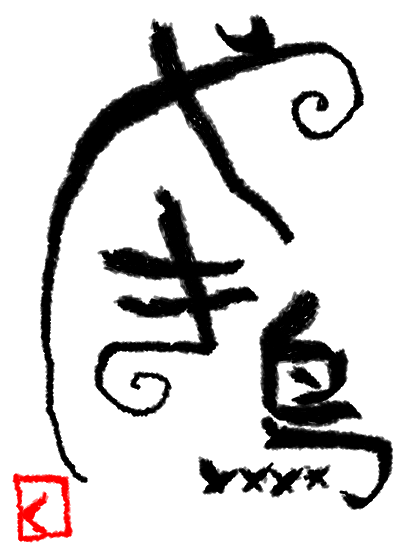

In [ ]:
# PIL : 파이썬 이미지 처리 라이브러리
# BytesIO : byte 단위로 in, out
from PIL import Image
from io import BytesIO
import requests

response = requests.get(url)
pic = Image.open(BytesIO(response.content))
pic

In [ ]:
type(img)

numpy.ndarray

In [ ]:
img.shape   # 컬러 이미지 이므로 채널=3

(550, 400, 3)

In [ ]:
# 이미지 copy 가 가능하다
img_copy = img.copy()
img_copy.shape

(550, 400, 3)

In [ ]:
print(img_copy[:,:,1], '\n')
print(img_copy[:,:,1].shape)

[[255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 ...
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]] 

(550, 400)


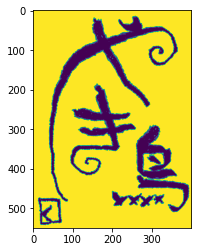

In [ ]:
# 숫자로 이미지 조작
plt.imshow(img_copy[:,:,0])
plt.show()

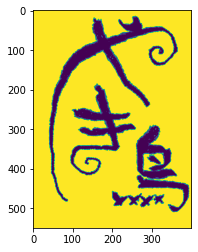

In [ ]:
plt.imshow(img_copy[:,:,2])
plt.show()

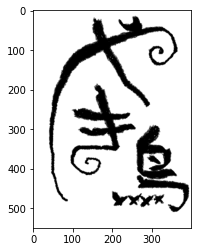

In [ ]:
plt.imshow(img_copy[:,:,2], cmap='gray')
plt.show()

### (2) OpenCV in Colab - 도형 그리기
0 은 검정, 255 는 흰색

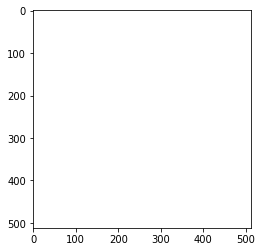

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

img = np.zeros((512,512,3), np.uint8)
img.fill(255)   # 255 로 채움
plt.imshow(img)
plt.show()

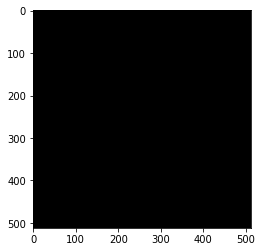

In [ ]:
img = np.zeros((512,512,3), np.uint8)
#print(img)
plt.imshow(img)
plt.show()

#### * Line 그리기

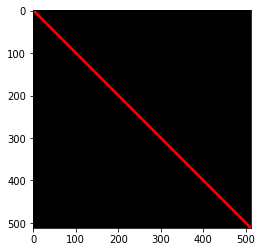

In [ ]:
# cv2.line(이미지, 시작점좌표, 끝점좌표, 선 색깔, 선 두께)
import cv2

img = cv2.line(img, (0,0), (511,511), (255,0,0), 5)
plt.imshow(img)
plt.show()

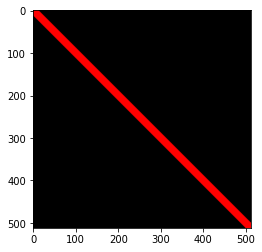

In [ ]:
# cv2.line(이미지, 시작점좌표, 끝점좌표, 선 색깔(R,G,B), 선 두께)
img = cv2.line(img, (0,0), (511,511), (255,0,0), 15)
plt.imshow(img)
plt.show()

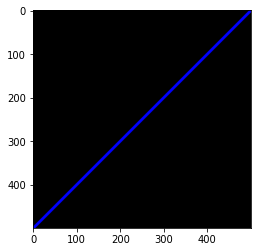

In [ ]:
# (500, 0) 의 오른족 상단 지점에서 (0, 500) 의 왼쪽 아래에 있는 점까지 연결된,
# 두께가 있는 (5pixel) 선

black_canvas = np.zeros((500, 500, 3), dtype='uint8')
blue = (0, 0, 255)
img = cv2.line(black_canvas, (500,0), (0,500), blue, 5)
plt.imshow(img)
plt.show()

#### * 도형 그리기

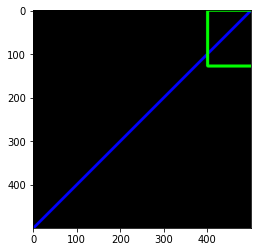

In [ ]:
# 사각형 그리기 : cv2.rectangle()
img = cv2.rectangle(img, (400,0), (510,128), (0,255,0), 5)
plt.imshow(img)
plt.show()

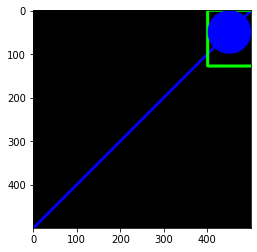

In [ ]:
# 원 그리기 : cv2.circle()
img = cv2.circle(img, (450,50), 50, (0,0,255), -1)
plt.imshow(img)
plt.show()

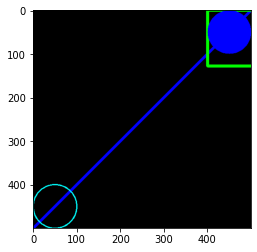

In [ ]:
img = cv2.circle(img, (50,450), 50, (0,255,255), 2)
plt.imshow(img)
plt.show()

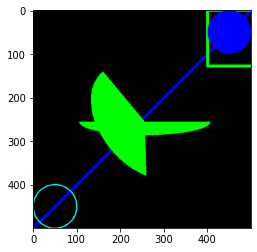

In [ ]:
# cv2.ellipse()
img = cv2.ellipse(img, (256,256), (150,30), 0, 0, 180, (0,255,0), -1)
plt.imshow(img)
plt.show()

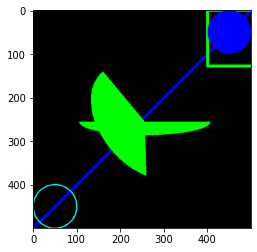

In [ ]:
img = cv2.ellipse(img, (256,256), (150,100), 50, 50, 180, (0,255,0), -1)
plt.imshow(img)
plt.show()

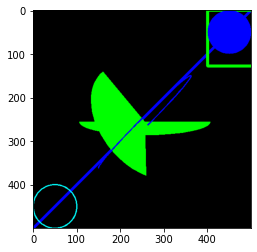

In [ ]:
# (150,10) : (중심에서 가장 긴 거리, 가장 짧은 거리)
img = cv2.ellipse(img, (256,256), (150,10), 135, 0, 270, (0,0,255), 2)
plt.imshow(img)
plt.show()

* cv2.ellipse(img=, center=, axes=, angle=, startAngle=, endAngle=, color=, thickness=)\
https://copycoding.tistory.com/147
  - img – image
  - center – 타원의 중심
  - axes – 중심에서 가장 큰 거리와 작은 거리
  - angle – 타원의 기울기 각
  - startAngle – 타원의 시작 각도
  - endAngle – 타원이 끝나는 각도
  - color – 타원의 색
  - thickness – 선 두께 -1이면 안쪽을 채움

  #### * 다각형

In [ ]:
# isClosed : 닫힌
pts = np.array([[10, 5], [20,30], [70, 20], [50, 10]], np.int32)
print(pts.shape)

pts = pts.reshape((-1, 2, 1))
print(pts.shape)

(4, 2)
(4, 2, 1)


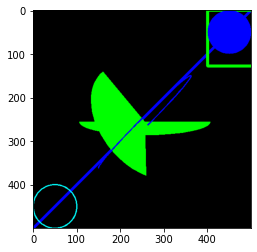

In [ ]:
image = np.zeros((512, 512, 3), np.uint8)
points = np.array([[255,280],[280,220],[330,210],[380,255],[380,310],[320,400],[255,450],
                   [190,400],[130,310],[130,255],[180,210],[230,220],[255,280]])
image = cv2.polylines(image, [points], True, (255,0,0), 5)
plt.imshow(img)
plt.show()

#### * Text : cv2.putText 메서드를 사용

- cv2.putText(image, text, pt, face, scale, color [,thickness [,linetype [,align]]])

 - image – 이미지
 - text – 출력 문자
 - pt – 출력 좌표(좌측 하단)
 - face – 폰트 face
 - scale –  크기
 - color – 색상
 - thickness –  두께
 - linetype – 선 종류(cv2.LINE_8, cv2.LINE_4, cv2.LINE_AA)
 - align – pt 옵션( True – 좌측 하단, False – 좌측 상단)


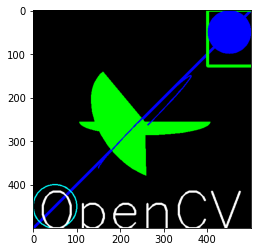

In [ ]:
img = cv2.putText(img, 'OpenCV', (10, 500), cv2.FONT_HERSHEY_SIMPLEX, 4, (255,255,255), 3)
plt.imshow(img)
plt.show()

- cv2.FONT_HERSHEY_SIMPLE
  - FONT_HERSHEY_PLAIN
  - FONT_HERSHEY_DUPLEX
  - FONT_HERSHEY_COMPLEX
  - FONT_HERSHEY_TRIPLEX
  - FONT_HERSHEY_COMPLEX_SMALL
  - FONT_HERSHEY_SCRIPT_SIMPLEX
  - FONT_HERSHEY_SCRIPT_COMPLEX

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

image = np.zeros((400,512,3), np.uint8)

cv2.putText(image, "FONT_HERSHEY_COMPLEX", (30,30), cv2.FONT_HERSHEY_COMPLEX, 1, (255,255,255))
cv2.putText(image, "FONT_HERSHEY_COMPLEX_SMALL", (30,70), cv2.FONT_HERSHEY_COMPLEX_SMALL, 1, (255,255,255))
cv2.putText(image, "FONT_HERSHEY_DUPLEX", (30,110), cv2.FONT_HERSHEY_DUPLEX, 1, (255,255,255))
cv2.putText(image, "FONT_HERSHEY_PLAIN", (30,150), cv2.FONT_HERSHEY_PLAIN, 1, (255,255,255))
cv2.putText(image, "FONT_HERSHEY_SCRIPT_COMPLEX", (30,190), cv2.FONT_HERSHEY_SCRIPT_COMPLEX, 1, (255,255,255))
cv2.putText(image, "FONT_HERSHEY_SCRIPT_SIMPLEX", (30,230), cv2.FONT_HERSHEY_SCRIPT_SIMPLEX, 1, (255,255,255))
cv2.putText(image, "FONT_HERSHEY_TRIPLEX", (30,310), cv2.FONT_HERSHEY_TRIPLEX, 1, (255,255,255))
cv2.imshow(image)

### (3) 컬러 매핑
- 주로 그레이 스케일, 트루 컬러 이미지를 많이 활용

- RGB :\
빛을 섞을 수록 밝아짐(가산혼합), 모니터, TV, 빔프로젝트 등에서 사용

- CMYK :\
섞을 수록 어두워지는 방식(감산혼합). 청록색, 자홍색, 노랑색, 검은색을 기본으로 하여 주로 컬러 프린터나 인쇄시에 사용

- YUV :\
Y축은 밝기 성분을 U,V 두축을 이용하여 색상 표현. 아날로그 방식

- YCbCr :\
Digital TV에서 사용하는 색공간. YPbPr이라는 아날로그 신호의 색공간을 디지털화한 것


In [ ]:
!wget -O dog.jpg https://cdn.pixabay.com/photo/2017/09/25/13/12/cocker-spaniel-2785074_960_720.jpg

--2022-12-28 00:46:56--  https://cdn.pixabay.com/photo/2017/09/25/13/12/cocker-spaniel-2785074_960_720.jpg
Resolving cdn.pixabay.com (cdn.pixabay.com)... 104.18.37.244, 172.64.150.12, 2606:4700:4400::ac40:960c, ...
Connecting to cdn.pixabay.com (cdn.pixabay.com)|104.18.37.244|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 132045 (129K) [binary/octet-stream]
Saving to: ‘dog.jpg’

dog.jpg             100%[===================>] 128.95K  --.-KB/s    in 0.02s   

2022-12-28 00:46:56 (5.52 MB/s) - ‘dog.jpg’ saved [132045/132045]



In [ ]:
!ls

dog.jpg  drive	sample_data


In [ ]:
import cv2

origin_img = cv2.imread('/content/dog.jpg')
print(origin_img.shape)

(640, 960, 3)


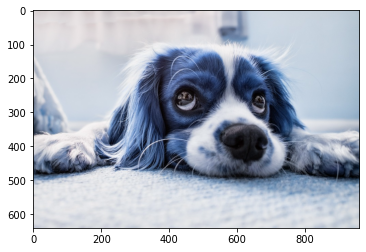

In [ ]:
# matplotlib 사용하여 이미지 출력
import matplotlib.pyplot as plt
plt.imshow(origin_img)
plt.show()

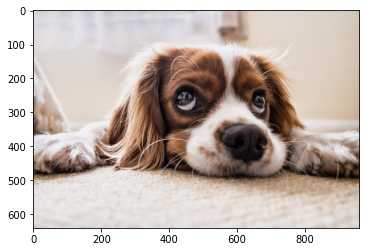

In [ ]:
img_rgb = cv2.cvtColor(origin_img, cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb)
plt.show()

#### * HSV Color Space
- 색상 (Hue), 채도 (Saturation), 명도 (Value) 로 색을 표현

- 색상은 색의 종류, 채도는 색의 순도, 명도는 빛의 세기

- OpenCV 에서 BGR2HSV 색 공간을 변환할 경우\
H(0~179 사이 정수), S(0 ~ 255 사이 정수), V(0 ~ 255 사이 정수)
 - 색상 값은 0 ~ 360 으로 표시하지만 uchar 자료형은 256 이상의 정수를 표현할 수 없기 때문에\
 OpenCV 에서는 각도를 2로 나눈 값을 'H' 로 저장한다

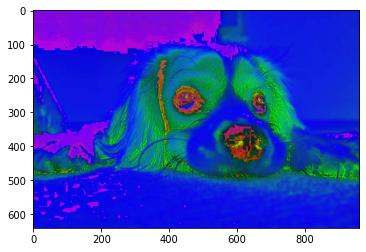

In [ ]:
img_hsv = cv2.cvtColor(origin_img, cv2.COLOR_BGR2HSV)
plt.imshow(img_hsv)
plt.show()

#### * HSL Color Space
- 색상(Hue), 채도(Satulation), 밝기(Lightness)로 표현하는 방식

- HSV 와 동일하지만 밝기 요소의 차이가 있다

- HSV 와 더불어 사람이 실제로 color 를 인지하는 방식과 유사하다

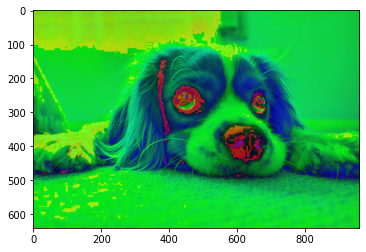

In [ ]:
img_hls = cv2.cvtColor(origin_img, cv2.COLOR_BGR2HLS)
plt.imshow(img_hls)
plt.show()

In [ ]:
print(np.max(img_hls), np.min(img_hls))

255 0


#### * YCrCb Color Space
- Y 성분은 밝기 또는 휘도(luminance), Cr, Cb 성분은 색상 또는 색차를 나타냄

- Cr, Cb는 오직 색상 정보만 가지고 있음. 밝기 정보 없음

- 영상을 GrayScale 정보와 색상 정보로 분리하여 처리할 때 유용

- 0 ~ 255 사이의 정수로 표현

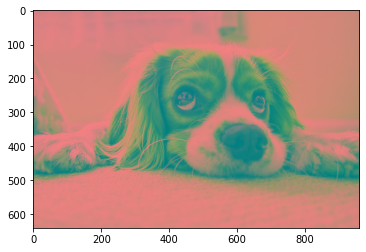

In [ ]:
img_ycrcb = cv2.cvtColor(origin_img, cv2.COLOR_BGR2YCrCb)
plt.imshow(img_ycrcb)
plt.show()

#### * GrayScale Color Space 
- 영상의 밝기 정보를 256단계(0 ~ 255)로 구분하여 표현

- 가장 밝은 흰색 : 255\
  가장 어두운 검은색 : 0

In [ ]:
img_gray = cv2.cvtColor(origin_img, cv2.COLOR_BGR2GRAY)
print(img_gray.shape)

(640, 960)


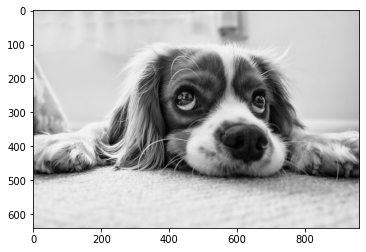

In [ ]:
plt.imshow(img_gray, cmap='gray')
plt.show()

#### * imread 사용법
https://scribblinganything.tistory.com/488

- cv2.imread(fileName, flag) :\
fileName 은 이미지 파일의 경로를 의미하고, flag 는 이미지 파일을 읽을 때의 옵션이다
 - flag 는 총 3가지가 있으며, 명시적으로 써줘도 되고 숫자를 사용해도 된다

- cv2.IMREAD_COLOR(1) : 이미지 파일을 Color로 읽음. 투명한 부분은 무시하며 Default 설정

- cv2.IMREAD_GRAYSCALE(0) : 이미지 파일을 Grayscale로 읽음. 실제 이미지 처리시 중간 단계로 많이 사용

- cv2.IMREAD_UNCHAGED(-1) : 이미지 파일을 변형 없이 원본 읽기

In [ ]:
!wget -O flower1.jpg https://cdn.pixabay.com/photo/2015/10/09/00/55/lotus-978659_960_720.jpg
!wget -O flower2.jpg https://cdn.pixabay.com/photo/2012/03/01/00/55/garden-19830_960_720.jpg

--2022-12-26 03:40:59--  https://cdn.pixabay.com/photo/2015/10/09/00/55/lotus-978659_960_720.jpg
Resolving cdn.pixabay.com (cdn.pixabay.com)... 172.64.150.12, 104.18.37.244, 2606:4700:4400::6812:25f4, ...
Connecting to cdn.pixabay.com (cdn.pixabay.com)|172.64.150.12|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 101795 (99K) [binary/octet-stream]
Saving to: ‘flower1.jpg’

flower1.jpg         100%[===================>]  99.41K  --.-KB/s    in 0.007s  

2022-12-26 03:40:59 (14.6 MB/s) - ‘flower1.jpg’ saved [101795/101795]

--2022-12-26 03:40:59--  https://cdn.pixabay.com/photo/2012/03/01/00/55/garden-19830_960_720.jpg
Resolving cdn.pixabay.com (cdn.pixabay.com)... 172.64.150.12, 104.18.37.244, 2606:4700:4400::6812:25f4, ...
Connecting to cdn.pixabay.com (cdn.pixabay.com)|172.64.150.12|:443... connected.
HTTP request sent, awaiting response... 403 Forbidden
2022-12-26 03:40:59 ERROR 403: Forbidden.



In [ ]:
!ls

214.png  drive	      flower2.jpg  sample_data
dog.jpg  flower1.jpg  lady.png	   sample.png


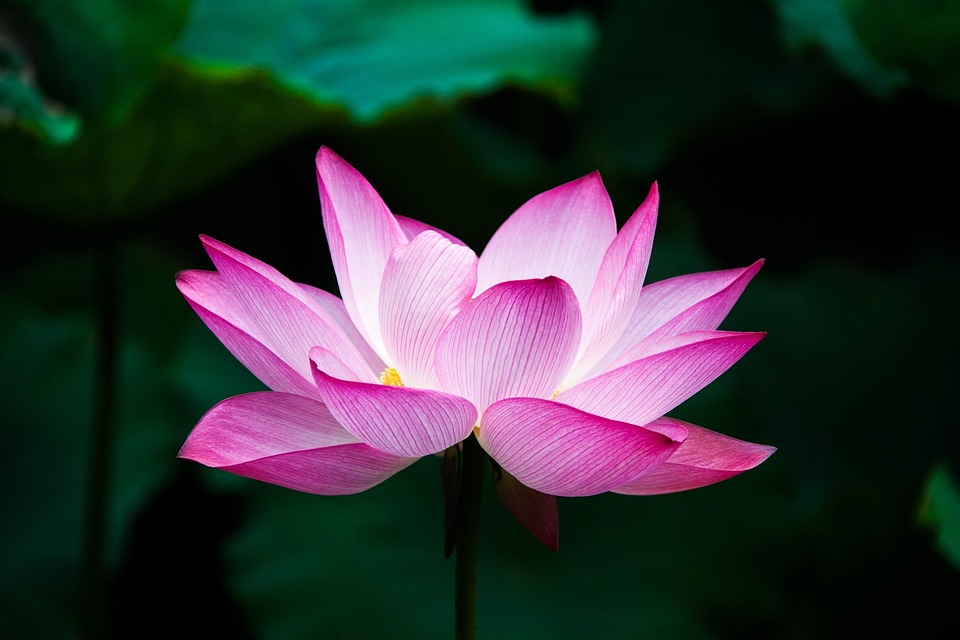

In [ ]:
#img = cv2.imread('/content/flower1.jpg', cv2.IMREAD_UNCHAGED)
img = cv2.imread('/content/flower1.jpg', -1)
cv2_imshow(img)

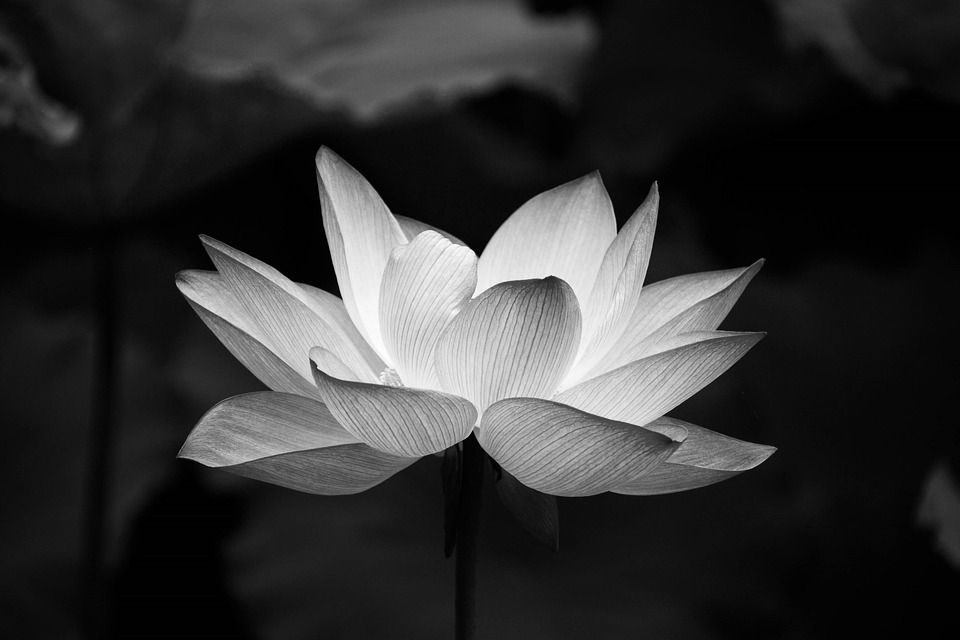

In [ ]:
img = cv2.imread('/content/flower1.jpg', cv2.IMREAD_GRAYSCALE)
cv2_imshow(img)

# 221227 Day86

#### cv2.calcHist(images, channels, maskm histSize, ranges, hist=None, accumulate=None) -> hist

 - images: 입력 영상 리스트

 - channels: 히스토그램을 구할 채널을 나타내는 리스트
 
 - mask: 마스크 영상. 입력 영상 전체에서 히스토그램을 구하려면 None 지정
 
 - histSize: 히스토그램 각 차원의 크기(빈(bin)의 개수)를 나타내는 리스트
 
 - ranges: 히스토그램 각 차원의 최솟값과 최댓값으로 구성된 리스트
 
 - hist: 계산된 히스토그램 (numpy.ndarray)
 
 - accumulate: 기존의 hist 히스토그램에 누적하려면 True, 새로 만들려면 False


In [ ]:
!wget -O flower1.jpg https://cdn.pixabay.com/photo/2015/10/09/00/55/lotus-978659_960_720.jpg
!wget -O flower2.jpg https://cdn.pixabay.com/photo/2012/03/01/00/55/garden-19830_960_720.jpg

--2022-12-27 00:15:03--  https://cdn.pixabay.com/photo/2015/10/09/00/55/lotus-978659_960_720.jpg
Resolving cdn.pixabay.com (cdn.pixabay.com)... 172.64.150.12, 104.18.37.244, 2606:4700:4400::ac40:960c, ...
Connecting to cdn.pixabay.com (cdn.pixabay.com)|172.64.150.12|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 101795 (99K) [binary/octet-stream]
Saving to: ‘flower1.jpg’

flower1.jpg         100%[===================>]  99.41K  --.-KB/s    in 0.008s  

2022-12-27 00:15:04 (11.8 MB/s) - ‘flower1.jpg’ saved [101795/101795]

--2022-12-27 00:15:04--  https://cdn.pixabay.com/photo/2012/03/01/00/55/garden-19830_960_720.jpg
Resolving cdn.pixabay.com (cdn.pixabay.com)... 172.64.150.12, 104.18.37.244, 2606:4700:4400::ac40:960c, ...
Connecting to cdn.pixabay.com (cdn.pixabay.com)|172.64.150.12|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 149575 (146K) [binary/octet-stream]
Saving to: ‘flower2.jpg’

flower2.jpg         100%[==================

In [ ]:
import cv2
from google.colab.patches import cv2_imshow

img1 = cv2.imread('/content/flower1.jpg', 0)
img2 = cv2.imread('/content/flower2.jpg', 0)

In [ ]:
hist1 = cv2.calcHist(images=[img1], channels=[0], mask=None, histSize=[256], ranges=[0,256])
hist2 = cv2.calcHist(images=[img2], channels=[0], mask=None, histSize=[256], ranges=[0,256])

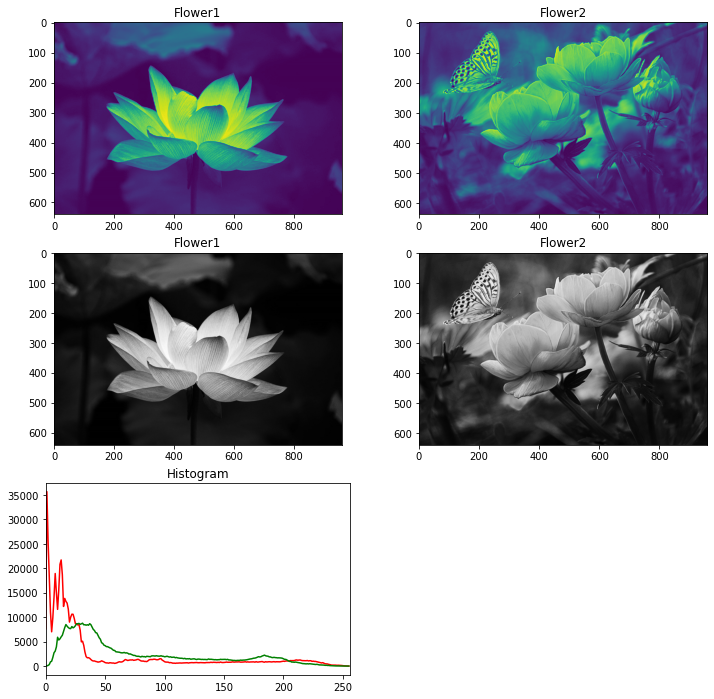

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12,12))
plt.subplot(321)
plt.imshow(img1)
plt.title('Flower1')

plt.subplot(322)
plt.imshow(img2)
plt.title('Flower2')

plt.subplot(323)
plt.imshow(img1, 'gray')
plt.title('Flower1')

plt.subplot(324)
plt.imshow(img2, 'gray')
plt.title('Flower2')

plt.subplot(325)
plt.plot(hist1, color='r')
plt.plot(hist2, color='g')
plt.xlim([0,256])
plt.title('Histogram')

plt.show()

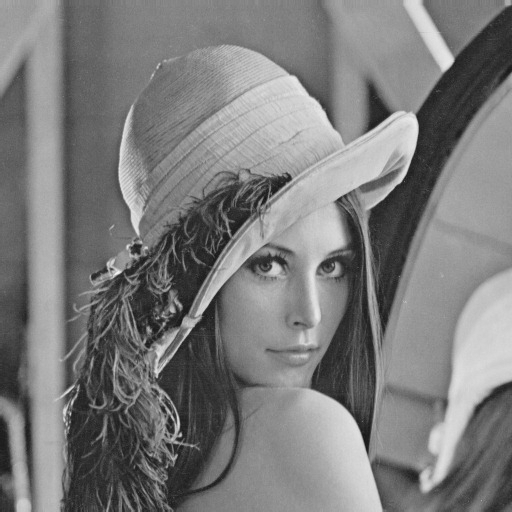

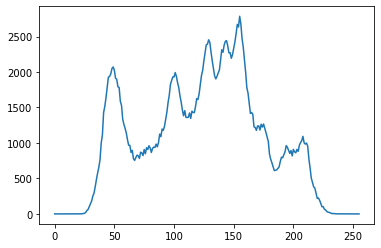

In [ ]:
#cv2.calcHist(images=, channels=, mask=, histSize=, ranges=)
#from google.colab.patches import cv2_imshow
import sys

# cv2.IMREAD_GRAYSCALE 또는 0 : 흑백 이미지로 출력
src = cv2.imread('/content/drive/MyDrive/files/221226 ~ 221230/Lena.png', cv2.IMREAD_GRAYSCALE)

if src is None:
  print('Image load failed!')
  sys.exit()

# 그레이스케일 [0], BG, [0,1], BGR, [0,1,2]
hist = cv2.calcHist(images=[src], channels=[0], mask=None,
                    histSize=[256], ranges=[0,256])   # 꼭 리스트 형태로 입력

cv2_imshow(src)
#cv2_waitKey(1)    # 1로 설정한 이유 : 다음 matplot 명령어를 실행시키기 위함

plt.plot(hist)
plt.show()

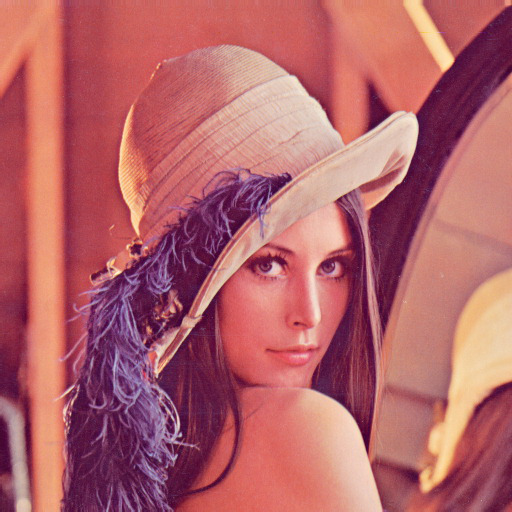

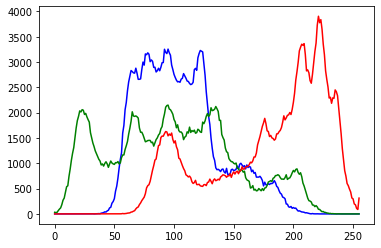

In [ ]:
#cv2.calcHist(images=, channels=, mask=, histSize=, ranges=)
# cv2.IMREAD_UNCHAGED 또는 -1 : 이미지 원본으로 읽기
src = cv2.imread('/content/drive/MyDrive/files/221226 ~ 221230/Lena.png', -1)

if src is None:
  print('Image load failed!')
  sys.exit()

colors = ['b','g','r']
bgr_planes = cv2.split(src)

for (p, c) in zip(bgr_planes, colors):
  hist = cv2.calcHist(images=[p], channels=[0], mask=None, histSize=[256], ranges=[0,256])
  plt.plot(hist, color=c)

cv2_imshow(src)
#cv2_waitKey(1)    # 1로 설정한 이유 : 다음 matplot 명령어를 실행시키기 위함

#plt.plot(hist)
plt.show()

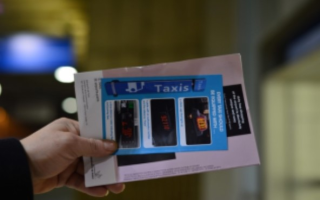

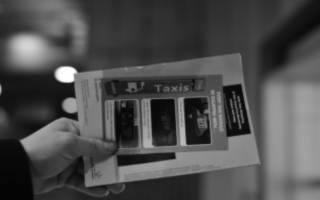

In [ ]:
#import cv2
#from google.colab.patches import cv2_imshow
import numpy as np

path = '/content/drive/MyDrive/files/221226 ~ 221230/ticket.jpg'
image = cv2.imread(path, cv2.IMREAD_COLOR)

# 이미지를 로딩한 후에 크기를 너비 320, 높이 200인 이미지로 변환
src_image = cv2.resize(image, dsize=(320,200), interpolation=cv2.INTER_AREA)

# cvtColor 메서드 : 이미지 변환
# 이미지와 옵션을 COLOR_BGR2GRAY 로 전달하면 컬러 이미지를 흑백으로 전환
gray_image = cv2.cvtColor(src_image, cv2.COLOR_BGR2GRAY)

cv2_imshow(src_image)
print()
cv2_imshow(gray_image)

* interpolation : 이미지 보간법\
https://bigdata-analyst.tistory.com/205 \
cv2 resize의 파라미터는\
(이미지, (직접 지정할 크기), fx=현재 이미지 가로의 몇배, fy= 현재 이미지 세로의 몇배, 보간법) 으로 구성

 - cv2.INTER_CUBIC : 바이큐빅 보간법\
 사이즈를 늘릴 때 (LINEAR보다 속도가 느림)

 - cv2.INTER_LINEAR : 쌍선형 보간법\
 사이즈를 늘릴 때 (default)

 - cv2.INTER_AREA : 영역 보간법\
 사이즈를 줄일 때


In [ ]:
print(src_image.shape)
print(gray_image.shape)
print(max(gray_image[0,:]))
print(max(gray_image[0]))

(200, 320, 3)
(200, 320)
117
117


### (4) 이미지 임계처리
https://opencv-python.readthedocs.io/en/latest/doc/09.imageThresholding/imageThresholding.html

- 이미지 이진화의 방법인\
Simple thresholding, Adaptive thresholding, Otsu’s thresholding

- 기본 임계처리 :\
이진화란 영상을 흑/백으로 분류하여 처리하는 것으로, 이때 기준이 되는 임계값을 어떻게 결정할 것인지가 중요한 문제가 된다. 임계값보다 크면 백, 작으면 흑이 된다.\
(흰색, 검은색의 구분이 더 명확해짐)\
기본 임계처리는 사용자가 고정된 임계값을 결정하고 그 결과를 보여주는 단순한 형태이다

- Parameters:	
 - src : input image로 single-channel 이미지.(grayscale 이미지)
 - thresh : 임계값
 - maxval : 임계값을 넘었을 때 적용할 value
 - type : thresholding type


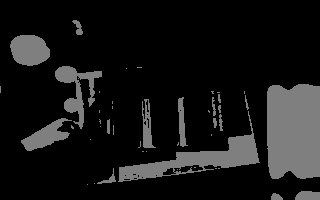

In [ ]:
# 이진화 : 영상을 흑/백으로 분류하여 처리하는 것
# 임계값 127 : 255의 1/2 --> 따라서 이미지의 흑/백이 명확히 구분되지 X

_, bin_image = cv2.threshold(src=gray_image, thresh=127, maxval=127, type=cv2.THRESH_BINARY)
cv2_imshow(bin_image)

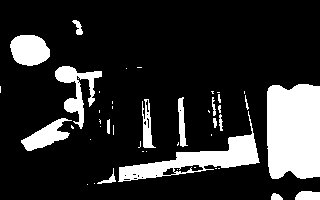

In [ ]:
# 특정값을 기준으로 Threshold, 이진화
# cv2 의 threshold 메서드에 흑백이미지, 기준값과 원하는 값, cv2.THRESH_BINARY 옵션 전달하면 이진화 지정

_, bin_image = cv2.threshold(src=gray_image, thresh=127, maxval=255, type=cv2.THRESH_BINARY)
cv2_imshow(bin_image)

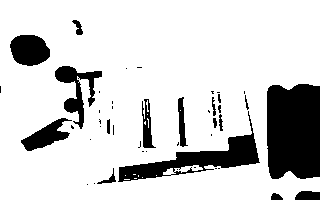

In [ ]:
# threshold 메서드의 cv2.THRESH_BINARY_INV : 이진화 역변환
_, bin_inv_image = cv2.threshold(src=gray_image, thresh=127, maxval=255, type=cv2.THRESH_BINARY_INV)
cv2_imshow(bin_inv_image)

### (5) 이미지 비트 연산
https://copycoding.tistory.com/156

- 0, 1을 가지고 하는 연산

- 두 이미지의 동일한 위치에 대한 and, or, not, xor 연산

- 색이 없으면 검게 보이고 (0), 색이 있으면 흰색 (1) 로 표현된다

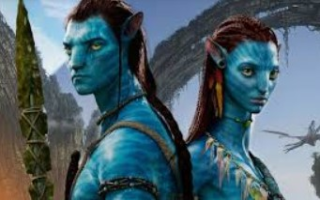

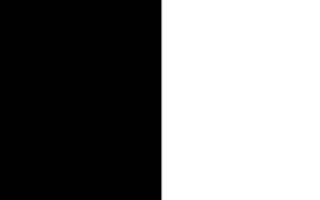

In [ ]:
# 이미지 경로 지정

import cv2
from google.colab.patches import cv2_imshow

path1 = '/content/drive/MyDrive/files/221226 ~ 221230/avatar.jpg'
path2 = '/content/drive/MyDrive/files/221226 ~ 221230/black_white.jpg'

image1 = cv2.imread(path1, cv2.IMREAD_COLOR)
image1 = cv2.resize(image1, dsize=(320, 200), interpolation=cv2.INTER_AREA)

image2 = cv2.imread(path2, cv2.IMREAD_COLOR)
image2 = cv2.resize(image2, dsize=(320, 200), interpolation=cv2.INTER_AREA)

# 2개의 원본 이미지 출력
cv2_imshow(image1)
print()
cv2_imshow(image2)

In [ ]:
image1.shape

(200, 320, 3)

In [ ]:
image1[0][:5]

array([[208, 190, 167],
       [209, 192, 166],
       [208, 188, 163],
       [207, 188, 161],
       [206, 189, 160]], dtype=uint8)

#### * AND 연산
- 두 그림에서 모두 1인 비트만 1로 나타난다 (모두 0이면 0)
 - 두 그림이 같지 않으면 0 (0 and 1 = 0, 1 and 0 = 0)

- 색이 없으면 검게 보이고 (0), 색이 있으면 흰색 (1)

- avatar 이미지의 왼쪽은 색이 있으므로 1, black_white의 왼쪽은 검정색으로 값이 0
 - and masking에 의해 0(검정색) 으로 변경\
 (and masking : 1 and 0 = 0)

- avatar 이미지의 오른쪽은 색이 있으므로 1, black_white의 오른쪽은 흰색(255)으로, 모든 비트가 1
 - 1 and 1 = 1, 따라서 avatar 이미지의 오른쪽은 변하지 않는다


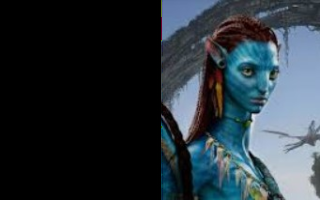

In [ ]:
and_image = cv2.bitwise_and(image1, image2)
cv2_imshow(and_image)

#### * OR 연산
- 이미지 비트 OR를 수행하면 모두 0인 비트만 0으로 나타남
 - 두 그림이 같지 않으면 1 (0 or 1 = 1, 1 or 0 = 1)

- black_white의 왼쪽은 검정색으로 값이 0, 모든 비트가 0

- avatar 이미지의 왼쪽은 1 변하지 않는다.

- black_white의 오른쪽은 흰색으로 값이 255, 모든 비트가 1

- 따라서 avatar 이미지의 오른쪽은 or masking에 의해 모든 비트가 1(255)로 변경(흰색)





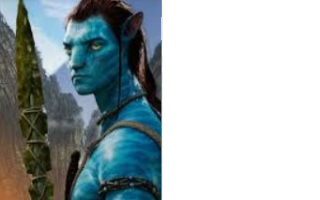

In [ ]:
or_image = cv2.bitwise_or(image1, image2)
cv2_imshow(or_image)

#### * Not 연산
- 이미지 비트 NOT을 수행하면 0은 1, 1은 0으로 변경(image1 색이 반전)


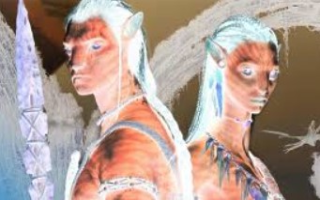

In [ ]:
not_image = cv2.bitwise_not(image1)
cv2_imshow(not_image)

#### * Xor 연산
- 이미지 비트 XOR를 수행하면 같은 값이면 0, 다른 값이면 1(1,1이 0이 되면서 반전)

- black_white의 왼쪽은 검정색으로 값이 0, 모든 비트가 0

- 따라서 avatar 이미지의 왼쪽은 변하지 않는다.(0과 0은 0, 0과 1은 1)

- black_white의 오른쪽은 흰색으로 값이 255, 모든 비트가 1

- 따라서 avatar 이미지의 오른쪽은 xor masking에 의해 모든 비트가 반전(1과 0은 1, 1과 1은 0)


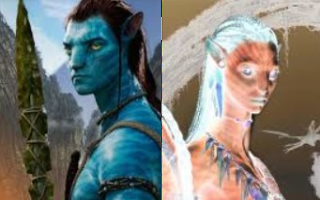

In [ ]:
xor_image = cv2.bitwise_xor(image1, image2)
cv2_imshow(xor_image)

### (6) 이미지 ROI
- 이미지 작업시에는 특정 pixel단위 보다는 특정 영역단위로 작업을 하게 되는데 이것을 Region of Image(ROI)라고 함

- ROI 설정은 Numpy의 indexing을 사용하고, 특정 영역을 copy할 수도 있음

In [ ]:
!ls

drive  flower1.jpg  flower2.jpg  sample1.jpg  sample_data


In [ ]:
spl = cv2.imread('/content/flower1.jpg')
print(spl.shape)

(640, 960, 3)


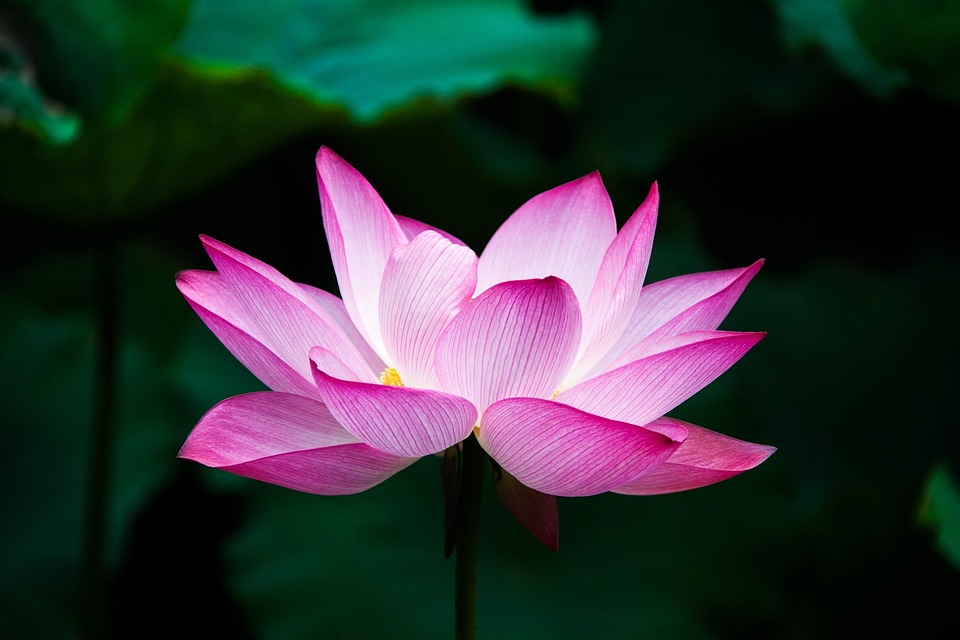

In [ ]:
cv2_imshow(spl)

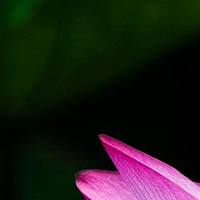

In [ ]:
# 특정 부분만
roi = spl[100:300, 100:300].copy()
cv2_imshow(roi)

#### * 관심영역(ROI) 표시하기
- 관심영역(ROI) : 이미지나 영상 내에서 관심이 있는 영역

(50, 50, 3)


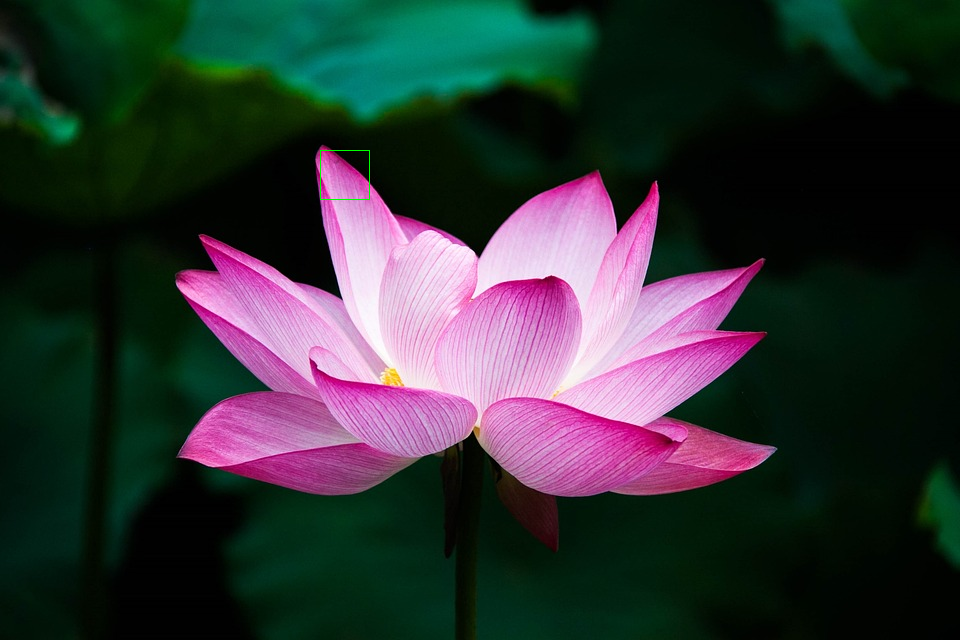

In [ ]:
# 관심영역 표시
#import cv2
#import numpy as np

img = cv2.imread('./flower1.jpg', 1)

# roi 좌표
x=320; y=150; w=50; h=50
# roi 지정
roi = img[y : y+h, x : x+w]

print(roi.shape)

# roi 전체에 사각형 그리기
# (0, 255, 0) : 녹색
cv2.rectangle(roi, (0,0), (h-1, w-1), (0, 255, 0))
cv2_imshow(img)

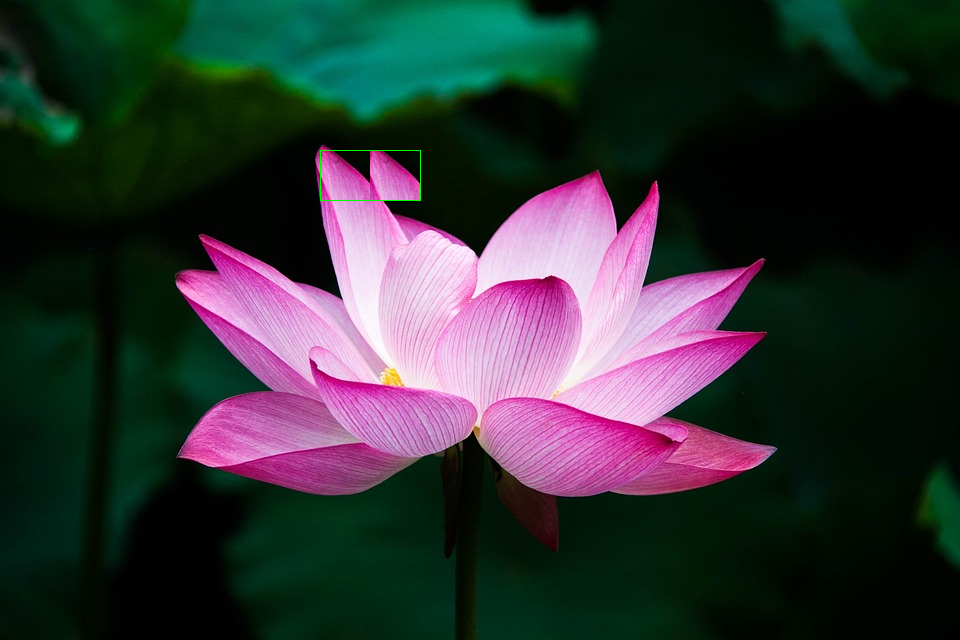

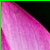

In [ ]:
# 관심영역 복제 및 새 창에 띄우기 : roi_copy.py
#import cv2
#import numpy as np

img = cv2.imread('./flower1.jpg')

# roi 좌표
x=320; y=150; w=50; h=50
# roi 지정
roi = img[y : y+h, x : x+w]   # [150:200, 320:370]

# roi 배열 복제
img2 = roi.copy()
# 새로운 좌표에 roi 추가, 태양 2개 만들기
img[y : y+h, x+w : x+w+w] = roi
# 2개의 영역에 사각형 표시
cv2.rectangle(img, (x,y), (x+w+w, y+h), (0,255,0))

#print(roi.shape)

# 원본 이미지 출력
cv2_imshow(img)
print()

# roi 배열 복제
img2 = roi.copy()

# roi 만 따로 출력
cv2_imshow(img2)

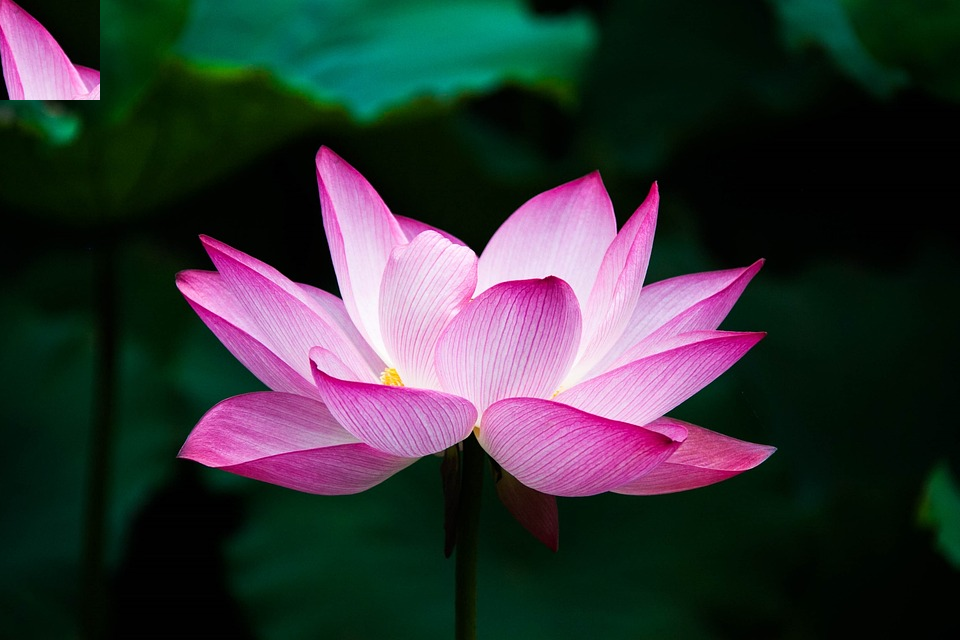

In [ ]:
img = cv2.imread('./flower1.jpg')

x=320; y=150; w=100; h=100

roi = img[y : y+h, x : x+w]

img[0:100, 0:100] = roi

cv2_imshow(img)

In [ ]:
!wget -O tree.jpg https://cdn.pixabay.com/photo/2020/08/22/00/24/desert-5507220_960_720.jpg

--2022-12-27 02:17:54--  https://cdn.pixabay.com/photo/2020/08/22/00/24/desert-5507220_960_720.jpg
Resolving cdn.pixabay.com (cdn.pixabay.com)... 172.64.150.12, 104.18.37.244, 2606:4700:4400::6812:25f4, ...
Connecting to cdn.pixabay.com (cdn.pixabay.com)|172.64.150.12|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 291743 (285K) [binary/octet-stream]
Saving to: ‘tree.jpg’

tree.jpg            100%[===================>] 284.91K  --.-KB/s    in 0.04s   

2022-12-27 02:17:54 (7.92 MB/s) - ‘tree.jpg’ saved [291743/291743]



In [ ]:
tree = cv2.imread('/content/tree.jpg')
print(tree.shape)

(646, 960, 3)


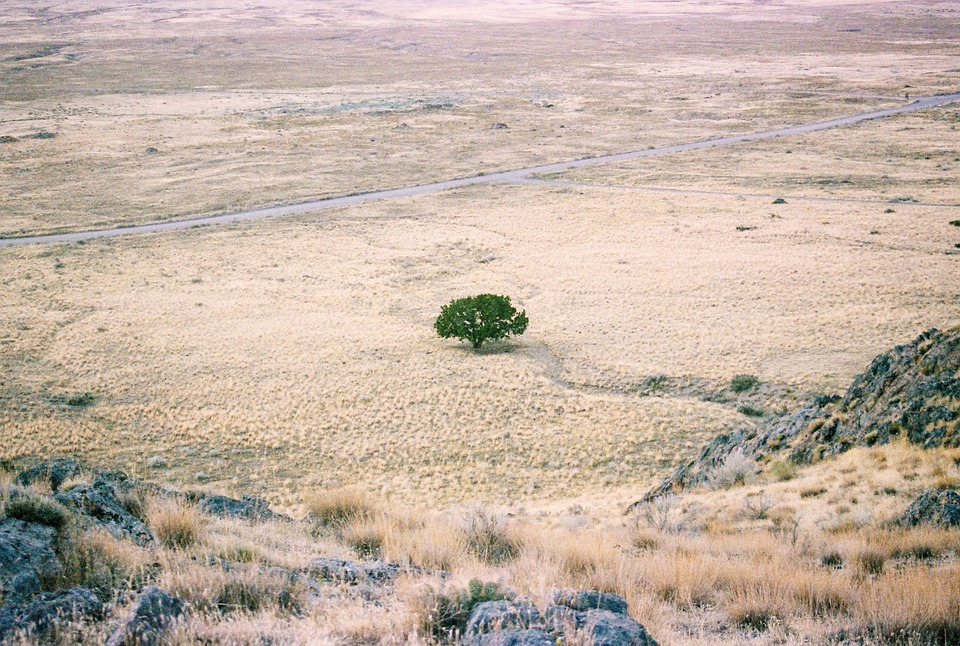

In [ ]:
cv2_imshow(tree)

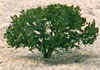

In [ ]:
t = tree[290:360, 430:530]   # 나무 이미지의 크기는 (70, 100)
cv2_imshow(t)

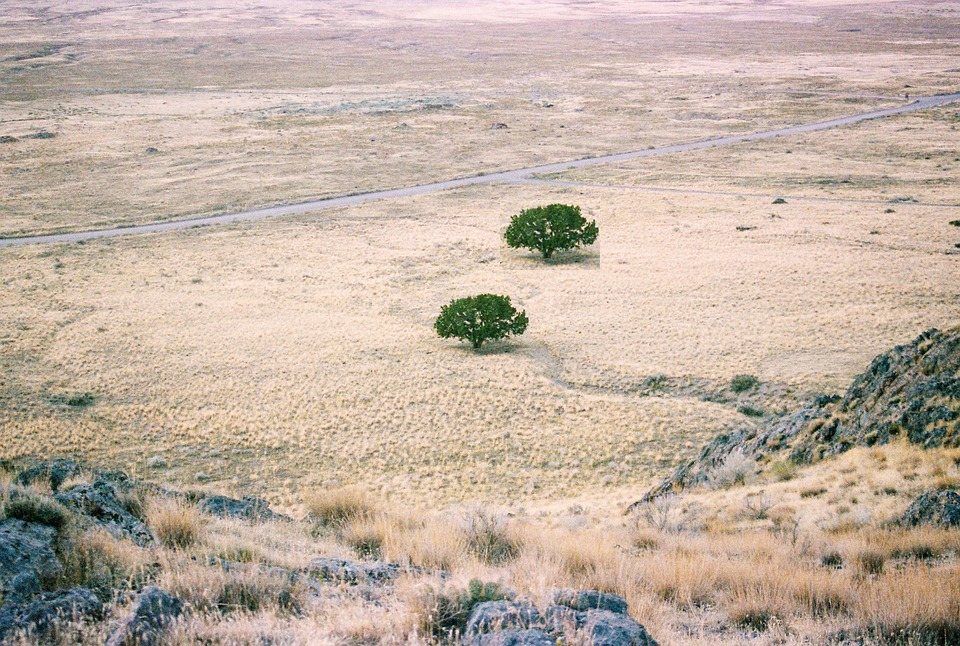

In [ ]:
# tree 이미지에서 원하는 위치에 나무 이미지 삽입
tree[200:270, 500:600] = t
cv2_imshow(tree)

In [ ]:
print(int(960/100))
print(int(646/70))

9
9


In [ ]:
#tree = cv2.imread('/content/tree.jpg')
#t = tree[290:360, 430:530]

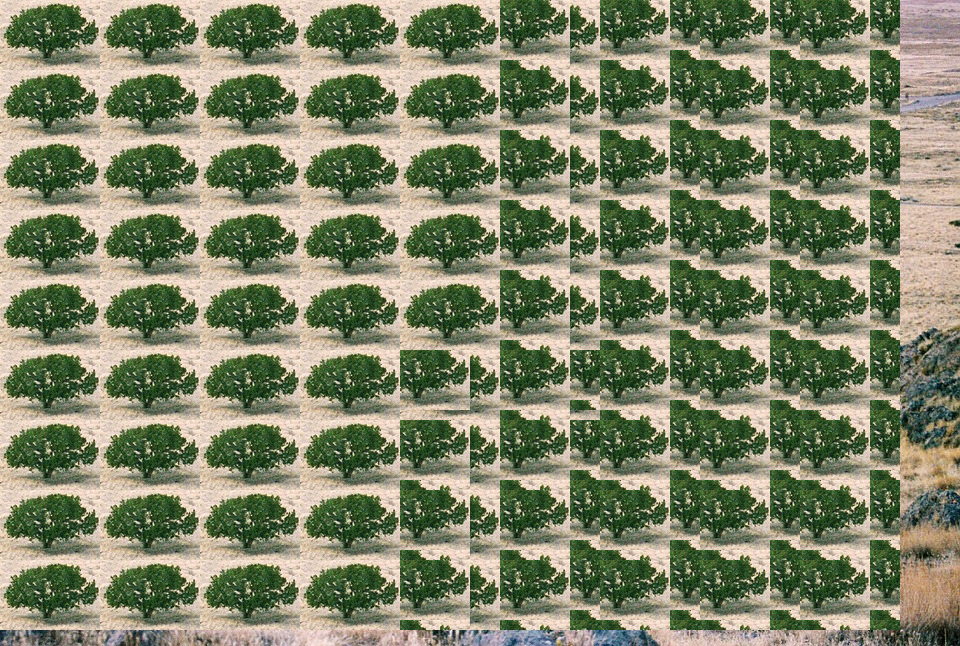

In [ ]:
# tree 이미지의 shape : (646, 960, 3)
for i in range(int(960/100)):
  for j in range(int(646/70)):
    tree[(j*70):(j*70)+70, (i*100):(i*100)+100] = t

cv2_imshow(tree)

In [ ]:
tree = cv2.imread('/content/tree.jpg')
t = tree[290:360, 430:530]

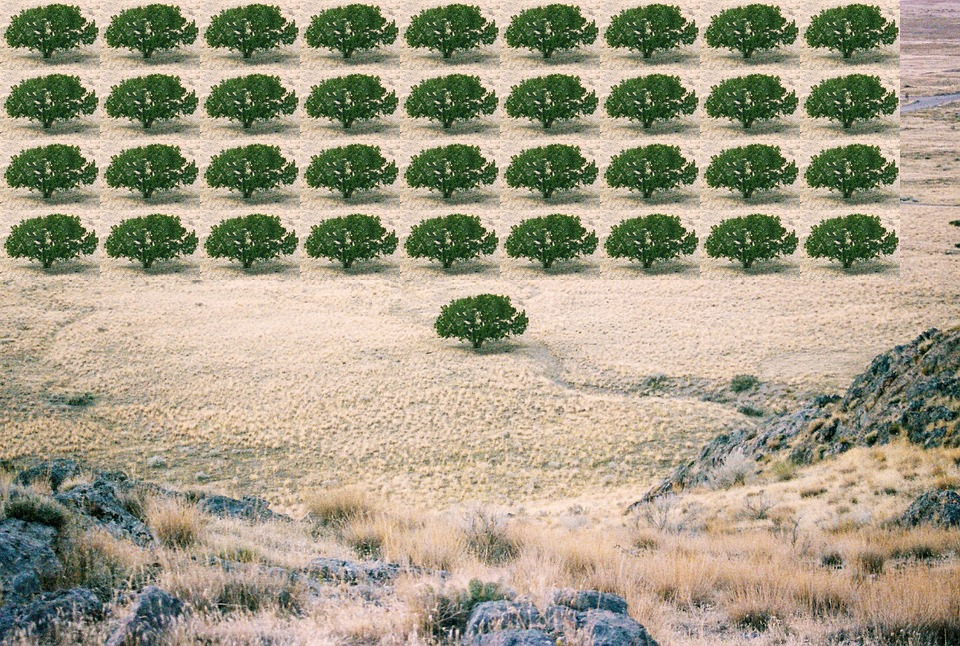

In [ ]:
for i in range(0, 211, 70):
  for j in range(0, 851, 100):
    tree[i:(i+70), j:(j+100)] = t

cv2_imshow(tree)

#### * ROI 평균값으로 이미지 나타내기
- 원본 이미지의 ROI를 계산해 그 평균값을 계산

- 평균값을 나타내는 것으로 N값이 커질수록 원본 영상과 비슷해지고\
작을수록 이미지의 전체 평균값과 비슷해져 구분하기 어려워짐


# 221228 Day87

In [ ]:
!wget -O dog.jpg https://cdn.pixabay.com/photo/2017/09/25/13/12/cocker-spaniel-2785074_960_720.jpg

--2022-12-28 01:49:32--  https://cdn.pixabay.com/photo/2017/09/25/13/12/cocker-spaniel-2785074_960_720.jpg
Resolving cdn.pixabay.com (cdn.pixabay.com)... 104.18.37.244, 172.64.150.12, 2606:4700:4400::ac40:960c, ...
Connecting to cdn.pixabay.com (cdn.pixabay.com)|104.18.37.244|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 132045 (129K) [binary/octet-stream]
Saving to: ‘dog.jpg’

dog.jpg             100%[===================>] 128.95K  --.-KB/s    in 0.02s   

2022-12-28 01:49:32 (5.56 MB/s) - ‘dog.jpg’ saved [132045/132045]



In [ ]:
!ls

dog.jpg  drive	sample_data


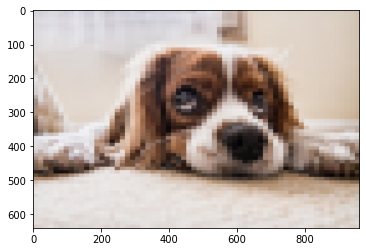

In [ ]:
# 모자이크 처리하기
import cv2

origin_img = cv2.imread('/content/dog.jpg')

height, width, _ = src.shape
N = 64

h = height // N
w = width // N

for i in range(N):
  for j in range(N):
    y = i*h
    x = j*w

    roi = origin_img[y:y+h, x:x+w]
    img_rgb[y:y+h, x:x+w] = cv2.mean(roi)[0:3]

img_rgb = cv2.cvtColor(img_rgb, cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb)

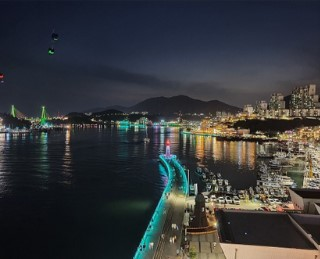

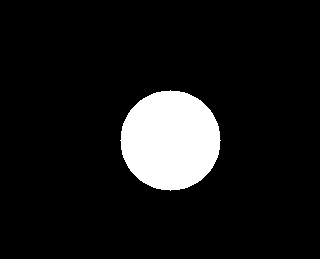

In [ ]:
# bitwise_and 연산으로 마스킹하기 (bitwise_masking.py)
from google.colab.patches import cv2_imshow
import cv2
import numpy as np
import matplotlib.pyplot as plt

# 이미지 읽기
img = cv2.imread('/content/drive/MyDrive/files/221226 ~ 221230/yeosu.jpg')

# 마스크 만들기
mask = np.zeros_like(img)
cv2.circle(mask, (170,140), 50, (255,255,255), -1)

# 결과 출력
cv2_imshow(img)
print()
cv2_imshow(mask)

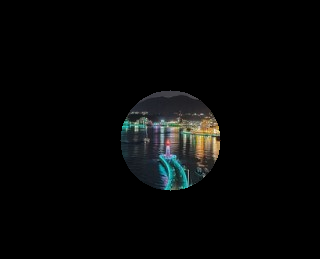

In [ ]:
# AND 연산
and_image = cv2.bitwise_and(img, mask)
cv2_imshow(and_image)

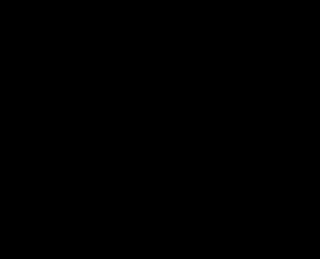

In [ ]:
and_image = cv2.bitwise_and(mask, img)
cv2_imshow(and_image)

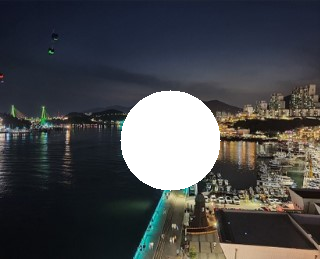

In [ ]:
# OR 연산
or_image = cv2.bitwise_or(img, mask)
cv2_imshow(or_image)

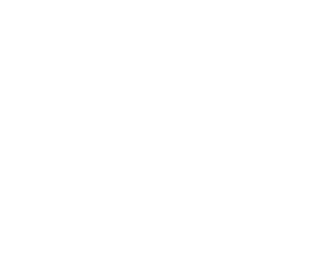

In [ ]:
or_image = cv2.bitwise_or(mask, img)
cv2_imshow(or_image)

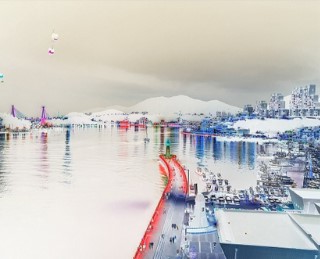

In [ ]:
# NOT 연산
not_image = cv2.bitwise_not(img, mask)
cv2_imshow(not_image)

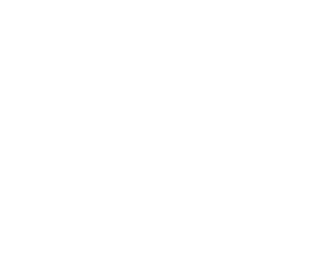

In [ ]:
# XOR 연산
xor_image = cv2.bitwise_xor(img, mask)
cv2_imshow(xor_image)

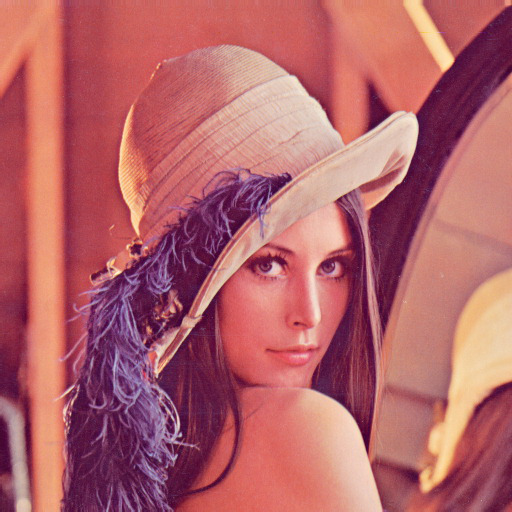

In [ ]:
src = cv2.imread('/content/drive/MyDrive/files/221226 ~ 221230/Lena.png')
cv2_imshow(src)

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving drag.jpg to drag.jpg


In [ ]:
ls

dog.jpg  drag.jpg  drive/  sample_data/


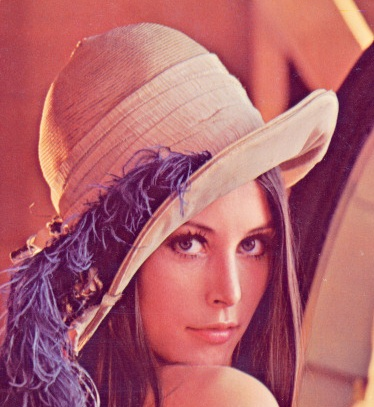

In [ ]:
from google.colab.patches import cv2_imshow
import cv2

path = 'drag.jpg'
img = cv2.imread(path, 1)
window_name = "Image"

cv2_imshow(img)

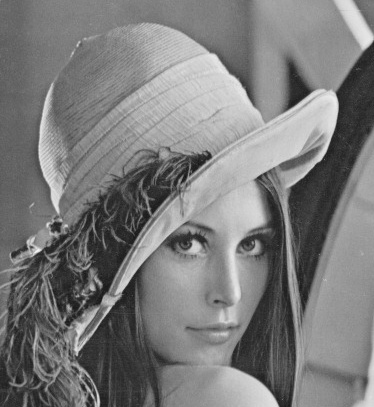

In [ ]:
img = cv2.imread(path, 0)
window_name = "Image"
cv2_imshow(img)

# 221229 Day88

### (7) OpenCV
- Open Source Computer Vision Library는 오픈소스 이미지(동영상) 라이브러리

- 이미지 형식 변환, 필터 처리, 얼굴 인식, 물체 인식, 문자 인식 등 이미지와 관련된 다양한 처리

- 머신러닝에서 OpenCV 사용 : 머신러닝의 입력으로 전달하려면 이미지를 숫자 배열 데이터로 변경

- pip install opencv-python


(800, 533, 3)


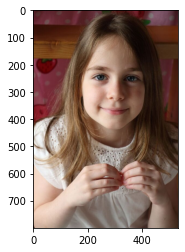

True

In [ ]:
# 다운로드한 이미지 출력하기
import matplotlib.pyplot as plt
import cv2

filepath = '/content/drive/MyDrive/files/221226 ~ 221230/girl.png'
img = cv2.imread(filepath)
print(img.shape)

# plt.axis('off') : axis 출력 안함
# OpenCV 는 BGR, matplotlib 은 RGB
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))   # 이미지 출력
plt.show()

# 이미지 저장
cv2.imwrite('/content/drive/MyDrive/files/221226 ~ 221230/girl1.png', img)

(800, 533, 3)


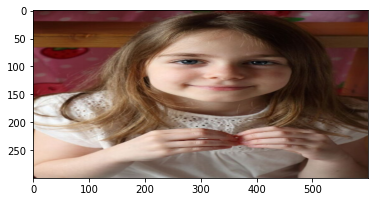

In [ ]:
# 이미지 읽기
filepath = '/content/drive/MyDrive/files/221226 ~ 221230/girl1.png'
img = cv2.imread(filepath)
print(img.shape)

# 이미지 크기 변경
img2 = cv2.resize(img, (600,300))   #image, (width, height)

# 크기 변경한 이미지 저장
cv2.imwrite('/content/drive/MyDrive/files/221226 ~ 221230/girl_out_resize.png', img)

# 이미지 출력
plt.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
plt.show()

(800, 533, 3)


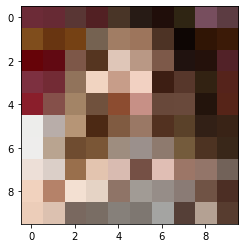

In [ ]:
# 이미지 읽기
filepath = '/content/drive/MyDrive/files/221226 ~ 221230/girl1.png'
img = cv2.imread(filepath)
print(img.shape)

# 이미지 크기 변경
img2 = cv2.resize(img, (10,10))   #image, (width, height)

# 크기 변경한 이미지 저장
#cv2.imwrite('/content/drive/MyDrive/files/221226 ~ 221230/girl_out_resize.png', img)

# 이미지 출력
plt.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
plt.show()

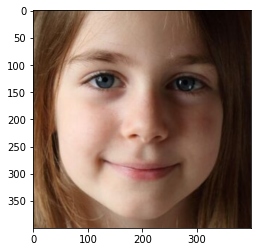

In [ ]:
# 이미지 읽기
filepath = '/content/drive/MyDrive/files/221226 ~ 221230/girl1.png'
img = cv2.imread(filepath)

# 이미지 자르기
img3 = img[150:450, 150:450]

# 이미지 크기 변경
img3 = cv2.resize(img3, (400,400))   #image, (width, height)

# 크기 변경한 이미지 저장
cv2.imwrite('/content/drive/MyDrive/files/221226 ~ 221230/girl_cut_resize.png', img)

# 이미지 출력
plt.imshow(cv2.cvtColor(img3, cv2.COLOR_BGR2RGB))
plt.show()

### (8) 물체 검출

#### 얼굴 검출 : 자동으로 얼굴에 모자이크 처리
- 인간의 얼굴이 어디 있는지 검출

- 사람의 얼굴을 검출하고 자동으로 모자이크 처리
 - 사생활 보호를 위해 관계없는 사람의 얼굴 자동으로 모자이크 처리

 - 얼굴 인식을 사용해 사람 얼굴이 있는 사진을 자동으로 수집


* [얼굴 검출 캐스케이드-얼굴 요소 데이터베이스]\
https://github.com/opencv/opencv/tree/master/data/haarcascades


* 캐스케이드 파일 지정해서 검출기 생성하기
 - OpenCV 는 Haar-like 특징 학습기라고 부르는 머신러닝을 사용해 얼굴을 인식한다

 - 캐스케이드 파일 (얼굴 요소 DB) 를 사용해 눈, 코, 입 과 같은 요소의 위치 관계를 확인하고, 얼굴인지 아닌지 확인

얼굴의 좌표 =  149 127 316 316


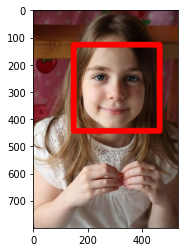

In [ ]:
# 얼굴 검출 전용 캐스케이드 파일 외 정면 얼굴, 웃는 얼굴, 눈, 몸 전체를 검출하는 다양한 캐스케이드 파일
cascade_file = '/content/drive/MyDrive/files/221226 ~ 221230/haarcascade_frontalface_alt.xml'
cascade = cv2.CascadeClassifier(cascade_file)   # 검출기는 캐스캐이드 파일을 지정해 다양한 물체 검출

# 이미지를 읽어 들이고 그레이스케일로 변환하기
# 밝은 부분은 흰색, 어두운 부분은 검은색, 코는 밝은 부분, 코의 양옆은 어두운 부분
# 얼굴 영역중에 중앙에 밝은 부분이 있다면 얼굴로 판단. 각 요소의 명암패턴을 결합해 얼굴의 형태 확인
filepath = '/content/drive/MyDrive/files/221226 ~ 221230/girl.png'
img = cv2.imread(filepath)
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# 얼굴 인식하기 : cascade.detectMultiScale()
face_list = cascade.detectMultiScale(img_gray, minSize=(150,150))   # 그레이스케일 이미지데이터, 얼굴 인식영역의 최소 크기 지정

# 결과 확인하기
if len(face_list) == 0:
  print("얼굴 인식 실패")
  quit()

# 인식한 부분 표시하기 : 검출한 얼굴 영역에 붉은색 테두리 랜더링
for (x, y, w, h) in face_list:
  print("얼굴의 좌표 = ", x, y, w, h)
  red = (0, 0, 255)
  cv2.rectangle(img, (x,y), (x+w, y+h), red, thickness=20)

# 이미지 저장 및 출력
cv2.imwrite('/content/drive/MyDrive/files/221226 ~ 221230/girl_face_detect.png', img)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.show()

### (9) 모자이크

In [ ]:
#import cv2

'''
# 모자이크 적용하는 모듈 생성
def mosaic(img, rect, size):
  # 모자이크 적용할 부분 추출하기
  (x1, y1, x2, y2) = rect
  w = x2 - x1
  h = y2 - y1
  i_rect = img[y1:y2, x1:x2]

  # 축소하고 확대하기
  i_small = cv2.resize(i_rect, (size, size))
  i_mos = cv2.resize(i_small, (w,h), interpolation = cv2.INTER_AREA)   # 보간법

  # 모자이크 적용하기
  img2 = img.copy()
  img2[y1:y2, x1:x2] = i_mos

  return img2
'''

In [ ]:
# 모듈 업로드
!cp /content/drive/MyDrive/files/mosaic.py /content

In [ ]:
!ls

drive  mosaic.py  sample_data


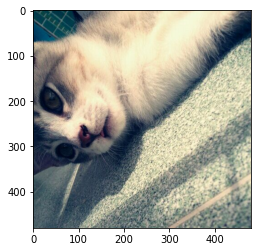

In [ ]:
img = cv2.imread('/content/drive/MyDrive/files/221226 ~ 221230/cat.png')

# 이미지 출력
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.show()

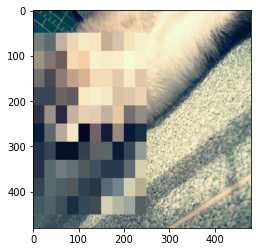

In [ ]:
#import matplotlib.pyplot as plt
#import cv2

from mosaic import mosaic as mosaic

# 이미지를 읽고 모자이크 처리
img = cv2.imread('/content/drive/MyDrive/files/221226~221230/cat.png')
mos = mosaic(img, (0,50,250,450), 10)

# 이미지 저장 및 출력
cv2.imwrite('/content/drive/MyDrive/files/221226~221230/cat_mosaic.png', mos)
plt.imshow(cv2.cvtColor(mos, cv2.COLOR_BGR2RGB))
plt.show()

#### 사람 얼굴에 자동으로 모자이크 처리

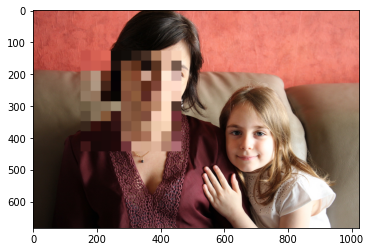

In [ ]:
# 캐스케이드 파일 지정해서 검출기 생성
cascade_file = "/content/drive/MyDrive/files/221226~221230/haarcascade_frontalface_alt.xml"
cascade = cv2.CascadeClassifier(cascade_file)   # 얼굴 정면을 인식할 수 있는 객체가 됨

# 이미지를 읽고 그레이 스케일로 변환
img = cv2.imread('/content/drive/MyDrive/files/221226~221230/family.jpg')
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# 얼굴 검출
face_lst = cascade.detectMultiScale(img_gray, minSize=(150,150))

if len(face_list) == 0:
  quit()

# 인식한 부분에 모자이크 처리
for (x, y, w, h) in face_list:
  img = mosaic(img, (x, y, x+w, y+h), 10)

# 이미지 저장 및 출력
cv2.imwrite('/content/drive/MyDrive/files/221226~221230/family_mosaic.jpg', img)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.show()

* 5명 이상의 사람 사진에 모자이크 처리

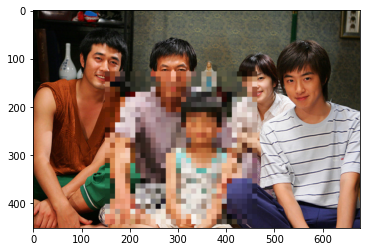

In [ ]:
# 캐스케이드 파일 지정해서 검출기 생성
cascade_file = "/content/drive/MyDrive/files/221226~221230/haarcascade_frontalface_alt.xml"
cascade = cv2.CascadeClassifier(cascade_file)   # 얼굴 정면을 인식할 수 있는 객체가 됨

# 이미지를 읽고 그레이 스케일로 변환
img = cv2.imread('/content/drive/MyDrive/files/221226~221230/5people.jpg')
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# 얼굴 검출
face_lst = cascade.detectMultiScale(img_gray, minSize=(100,100))

if len(face_list) == 0:
  quit()

# 인식한 부분에 모자이크 처리
for (x, y, w, h) in face_list:
  img = mosaic(img, (x, y, x+w, y+h), 30)

# 이미지 저장 및 출력
cv2.imwrite('/content/drive/MyDrive/files/221226~221230/5people_mosaic.jpg', img)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.show()

* OpenCV 의 얼굴 검출은 옆모습과 기울어진 얼굴을 잘 검출하지 못한다

---0---
얼굴의 좌표 = 135 109 352 352
---10---
얼굴의 좌표 = 174 149 350 350
---20---
얼굴의 좌표 = 198 177 362 362
---30---
---40---
---50---
---60---
---70---
---80---


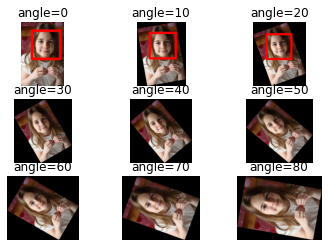

In [ ]:
#import matplotlib.pyplot as plt
#import cv2
from scipy import ndimage

# 검출기 생성하고 이미지 읽기
cascade_file = "/content/drive/MyDrive/files/221226~221230/haarcascade_frontalface_alt.xml"
cascade = cv2.CascadeClassifier(cascade_file)   # 얼굴 정면을 인식할 수 있는 객체가 됨
img = cv2.imread('/content/drive/MyDrive/files/221226~221230/girl.png')

# 얼굴 검출하고 영역 표시
def face_detect(img):
  img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  face_lst = cascade.detectMultiScale(img_gray, minSize=(300,300))

  # 인식한 부분 표시
  for (x, y, w, h) in face_lst:
    print('얼굴의 좌표 =', x, y, w, h)
    red = (0,0,255)
    cv2.rectangle(img, (x,y), (x+w, y+h), red, thickness=30)

# 여러 각도의 이미지를 만들고 테스트하기
for i in range(0, 9):
  ang = i*10   # 10도씩 각도 변환
  print('---' + str(ang) + '---')
  img_r = ndimage.rotate(img, ang)
  face_detect(img_r)

  plt.subplot(3, 3, i+1)
  plt.axis('off')
  plt.title('angle=' + str(ang))
  plt.imshow(cv2.cvtColor(img_r, cv2.COLOR_BGR2RGB))

plt.show()

# 221230 Day89

## Object Detection
https://velog.io/@bbirong/YOLO-Object-Detection
https://89douner.tistory.com/75

- CNN 모델 : 이미지 분류(classification)
 - 어떤 이미지가 들어오면 해당 이미지 내의 객체들이 무엇인지 알 수 있다

- Object Detection : classification 뿐만 아니라 localization 이라는 개념도 포함되어 있다
 - Object Detection = classification + localization
 - Localization 이란 객체라고 판단되는 곳에 '직사각형(bounding box)' 를 그려주는 것이다

- 어떤 이미지를 입력했을 때, 그 결과가 해당 객체를 localization(bounding box) 해주고,\
해당 box 안에 있는 객체가 무엇인지 classification 까지 해준다면 그것을 "Object Detection (객체검출)" 이라고 한다

* 객체 탐지
 - 한 이미지에서 객체와 그 경계 상자를 탐지
 - 객체 탐지 알고리즘은 일반적으로 이미지를 입력으로 받고 경계 상자와 객체 클래스 리스트를 출력
 - 객체 탐지는 '지도 학습' 을 한다
 - 경계 상자에 대해 그에 대응하는 예측 클래스와 클래스의 신뢰도를 출력
   - 신뢰도 : 예측한 것이 맞다는 정도 (확률)


* Applications
 - 자율 주행 자동차에서 다른 자동차와 보행자를 찾을 때
 - 의료 분야에서 방사선 사진을 사용해 종양이나 위험한 조직을 찾을 때
 - 제조업에서 조립 로봇이 제품을 조립하거나 수리할 때
 - 보안 산업에서 위협을 탐지하거나 사람 수를 셀 때

* Bounding Box (경계 상자)
 - 이미지에서 하나의 객체 전체를 포함하는 가장 작은 직사각형

   <img src="https://miro.medium.com/max/850/1*KL6r494Eyfh3iYEXQA2tzg.png">

  <sub>[이미지 출처] https://medium.com/anolytics/how-bounding-box-annotation-helps-object-detection-in-machine-learning-use-cases-431d93e7b25b</sub>

* IOU (Intersection Over Union)
 - 실측값(Ground Truth) 과 모델이 예측한 값이 얼마나 겹치는지를 나타내는 지표
 - IOU = Area of Overlap (예측값) / Area of Union (실제값)
 - IOU 가 높을수록 잘 예측한 모델

  <img src="https://pyimagesearch.com/wp-content/uploads/2016/09/iou_equation.png" width="300">
<br>
  <img src="https://pyimagesearch.com/wp-content/uploads/2016/09/iou_examples.png" width="400">

<br>

 - 예시
  <img src="https://www.pyimagesearch.com/wp-content/uploads/2016/09/iou_stop_sign.jpg">

  <sub>[이미지 출처] https://www.pyimagesearch.com/2016/11/07/intersection-over-union-iou-for-object-detection/</sub>


### object detection 발전과정

* RCNN (2013)
  - Rich feature hierarchies for accurate object detection and semantic segmentation (https://arxiv.org/abs/1311.2524)
  - 물체 검출에 사용된 기존 방식인 sliding window는 background를 검출하는 소요되는 시간이 많았는데, 이를 개선시킨 기법으로 Region Proposal 방식 제안
  - 매우 높은 Detection이 가능하지만, 복잡한 아키텍처 및 학습 프로세스로 인해 Detection 시간이 매우 오래 걸림

* SPP Net (2014)
  - Spatial Pyramid Pooling in Deep Convolutional Networks for Visual Recognition (https://arxiv.org/abs/1406.4729)
  - RCNN의 문제를 Selective search로 해결하려 했지만, bounding box의 크기가 제각각인 문제가 있어서 FC Input에 고정된 사이즈로 제공하기 위한 방법 제안
  - SPP은 RCNN에서 conv layer와 fc layer사이에 위치하여 서로 다른 feature map에 투영된 이미지를 고정된 값으로 풀링
  - SPP를 이용해 RCNN에 비해 실행시간을 매우 단축시킴

* Fast RCNN (2015)
  - Fast R-CNN (https://arxiv.org/abs/1504.08083)
  - SPP layer를 ROI pooling으로 바꿔서 7x7 layer 1개로 해결
  - SVM을 softmax로 대체하여 Classification 과 Regression Loss를 함께 반영한 Multi task Loss 사용
  - ROI Pooling을 이용해 SPP보다 간단하고, RCNN에 비해 수행시간을 많이 줄임

* Fater RCNN(2015)
  - Faster R-CNN: Towards Real-Time Object Detection with Region Proposal Networks (https://arxiv.org/abs/1506.01497)
  - RPN(Region proposal network) + Fast RCNN 방식
  - Selective Search를 대체하기 위한 Region Proposal Network구현
  - RPN도 학습시켜서 전체를 end-to-end로 학습 가능 (GPU사용 가능)
  - Region Proposal를 위해 Object가 있는지 없는지의 후보 Box인 Anchor Box 개념 사용
  - Anchor Box를 도입해 FastRCNN에 비해 정확도를 높이고 속도를 향상시킴

* SSD (2015)
  - SSD: Single Shot MultiBox Detector (https://arxiv.org/abs/1512.02325)
  - Faster-RCNN은 region proposal과 anchor box를 이용한 검출의 2단계를 걸치는 과정에서 시간이 필요해 real-time(20~30 fps)으로는 어려움
  - SSD는 Feature map의 size를 조정하고, 동시에 앵커박스를 같이 적용함으로써 1 shot으로 물체 검출이 가능
  - real-time으로 사용할 정도의 성능을 갖춤 (30~40 fps)
  - 작은 이미지의 경우에 잘 인식하지 못하는 경우가 생겨서 data augmentation을 통해 mAP를 63에서 74로 비약적으로 높임
  
* RetinaNet (2017)
  - Focal Loss for Dense Object Detection (https://arxiv.org/abs/1708.02002)
  - RetinaNet이전에는 1-shot detection과 2-shot detection의 차이가 극명하게 나뉘어 속도를 선택하면 정확도를 trade-off 할 수 밖에 없는 상황
  - RetinaNet은 Focal Loss라는 개념의 도입과 FPN 덕분에 기존 모델들보다 정확도도 높고 속도도 여타 1-shot detector와 비견되는 모델
  - Detection에선 검출하고 싶은 물체와 (foreground object) 검출할 필요가 없는 배경 물체들이 있는데 (background object) 배경 물체의 숫자가 매우 많을 경우 배경 Loss를 적게 하더라도 숫자에 압도되어 배경의 Loss의 총합을 학습해버림 (예를 들어, 숲을 배경으로 하는 사람을 검출해야하는데 배경의 나무가 100개나 되다보니 사람의 특징이 아닌 나무가 있는 배경을 학습해버림)

- Focal Loss는 이런 문제를 기존의 crossentropy 함수에서 (1-sig)을 제곱하여 background object의 loss를 현저히 줄여버리는 방법으로 loss를 변동시켜 해결
  - Focal Loss를 통해 검출하고자 하는 물체와 관련이 없는 background object들은 학습에 영향을 주지 않게 되고, 학습의 다양성이 더 넓어짐 (작은 물체, 큰 물체에 구애받지 않고 검출할 수 있게됨)
  - 실제로 RetinaNet은 object proposal을 2000개나 실시하여 이를 확인

* Mask R-CNN (2018)
  - Mask R-CNN (https://arxiv.org/pdf/1703.06870.pdf)

* YOLO (2018)
  - YOLOv3: An Incremental Improvement (https://arxiv.org/abs/1804.02767)
  - YOLO는 v1, v2, v3의 순서로 발전하였는데, v1은 정확도가 너무 낮은 문제가 있었고 이 문제는 v2까지 이어짐
  - 엔지니어링적으로 보완한 v3는 v2보다 살짝 속도는 떨어지더라도 정확도를 대폭 높인 모델
  - RetinaNet과 마찬가지로 FPN을 도입해 정확도를 높임
  - RetinaNet에 비하면 정확도는 4mAP정도 떨어지지만, 속도는 더 빠르다는 장점

* RefineDet (2018)
  - Single-Shot Refinement Neural Network for Object Detection (https://arxiv.org/pdf/1711.06897.pdf)

* M2Det (2019)
  - M2Det: A Single-Shot Object Detector based on Multi-Level Feature Pyramid Network (https://arxiv.org/pdf/1811.04533.pdf)

* EfficientDet (2019)
  - EfficientDet: Scalable and Efficient Object Detection (https://arxiv.org/pdf/1911.09070v1.pdf)

* YOLOv4 (2020)
  - YOLOv4: Optimal Speed and Accuracy of Object Detection (https://arxiv.org/pdf/2004.10934v1.pdf)
  - YOLOv3에 비해 AP (averege precision), FPS가 각각 10%, 12% 증가
  - YOLOv3와 다른 개발자인 AlexeyBochkousky가 발표
  - v3에서 다양한 딥러닝 기법(WRC, CSP ...) 등을 사용해 성능을 향상시킴
  - CSPNet 기반의 backbone(CSPDarkNet53)을 설계하여 사용
  - Backbone은 이미지로부터 Feature map을 추출하는 부분으로, CSP-Darknet를 사용합니다. YOLO v4의 백본과 유사합니다. YOLO v3의 Backbone은 Darknet53으로 CSP가 적용되지 않습니다. 특이하게도 YOLO v5의 backbone은 종류가 4가지나 됩니다. 제일 작고 가벼운 yolo v5-s부터 m, l, x 까지 포함해서 총 4가지 버전이 있습니다
  - Head는 추출된 Feature map을 바탕으로 물체의 위치를 찾는 부분입니다. 흔히 말하는 Anchor Box(Default Box)를 처음에 설정하고 이를 이용하여 최종적인 Bounding Box를 생성합니다. YOLO v3와 동일하게 3가지의 scale에서 바운딩 박스를 생성합니다. (8 pixel 정보를 가진 작은 물체, 16 pixel 정보를 가진 중간 물체, 32 pixel 정보를 가진 큰 물체를 인식 가능) 또한 각 스케일에서 3개의 앵커 박스를 사용합니다. 그러므로 총 9개의 앵커 박스가 있습니다.

* YOLOv5 (2020)
  - YOLOv4에 비해 낮은 용량과 빠른 속도 (성능은 비슷)
  - YOLOv4와 같은 CSPNet 기반의 backbone을 설계하여 사용
  - YOLOv3를 PyTorch로 실행(implementation)한 GlennJocher가 발표
  - Darknet이 아닌 PyTorch 구현이기 때문에, 이전 버전들과 다르다고 할 수 있음

* 이후
  - 수 많은 YOLO 버전들이 탄생
  - Object Detection 분야의 논문들이 계속해서 나오고 있음


## Dataset

### VOC

- 2005년부터 2012년까지 진행

- Object Detection 기술의 benchmark로 간주

- 데이터셋에는 20개의 클래스가 존재

- 훈련 및 검증 데이터 : 11,530개

- ROI에 대한 27,450개의 주석(Annotation)이 존재

- 이미지당 2.4개의 객체 존재

  <img src="https://paperswithcode.github.io/sotabench-eval/img/pascalvoc2012.png">

  <sub>[이미지 출처] https://paperswithcode.github.io/sotabench-eval/pascalvoc/</sub>

### COCO Dataset
- Common Objects in Context
- 200,000개의 이미지
- 80개의 카테고리에 500,000개 이상의 객체 Annotation이 존재
- voc 보다 더 많이 이용

https://cocodataset.org/


## YOLO (You Only Look Once)
- 가장 빠른 객체 검출 알고리즘 중 하나
- 256x256 사이즈의 이미지
- 파이썬, 텐서플로 기반 프레임워크가 아닌, C++ 로 구현된 코드 기준 GPU 사용 시, 초당 170 프레임

- YOLO 아키텍처
 - 백본 모델(backbone model) 기반
   - Backbone : 이미지로부터 Feature map을 추출하는 부분
 - 특징 추출기(Feature Extractor)라고도 불림
 - YOLO는 자체 맞춤 아키텍쳐 사용

 - 1 stage : 성능은 떨어지나, 속도는 빠름
 - 2 stage : 성능은 좋지만, 속도가 느림

  <img src="https://user-images.githubusercontent.com/26322627/70716343-8e857200-1d2f-11ea-8e60-9c75f24ca9ce.png">


### * Yolov5
Object detection 분야에서 많이 알려진 모델

처음으로 one-stage-detection 방법을 고안하여 실시간으로 Object Detection이 가능하게 만들었다.

* Yolov5 특징\
이미지 전체를 한번만 보는 것

 - R-CNN:\
 이미지 하나를 여러장으로 분할하고 CNN 모델을 이용하여 이미지를 분석\
 따라서 이미지 한장을 보더라도 여러장의 이미지를 분석하는 것과 같다\
 하지만 YOLO는 이러한 과정 없이 이미지를 "한 번만" 보는 특징을 가지고 있다
    - Object Detection의 구조와 종류 : https://ssong915.tistory.com/43

 - 백본(Backbone) :\
 입력이미지를 feature map으로 변형시켜주는 부분

 - 헤드(Head) :\
 Backbone에서 추출한 feature map의 location 작업을 해주는 부분\
 predict classes 와 bounding boxes 작업이 수행됨\
 헤드는 크게 Dense Prediction과 Sparse Prediction으로 나누어진다
   - Sparse Prediction을 사용하는 Two-Stage Detector:\
 Predict Classes 와 Bounding Box Regression 분리 ex) R-CNN, R-FCN 
   - Dense Prediction을 사용하는 One-Stage Detector:\
 Predict Classes 와 Bounding Box Regression 통합 ex) YOLO, SSD

 - 넥(Neck) :\
 Backbone 과 Head를 연결하는 부분, feature map을 정제하고 재구성

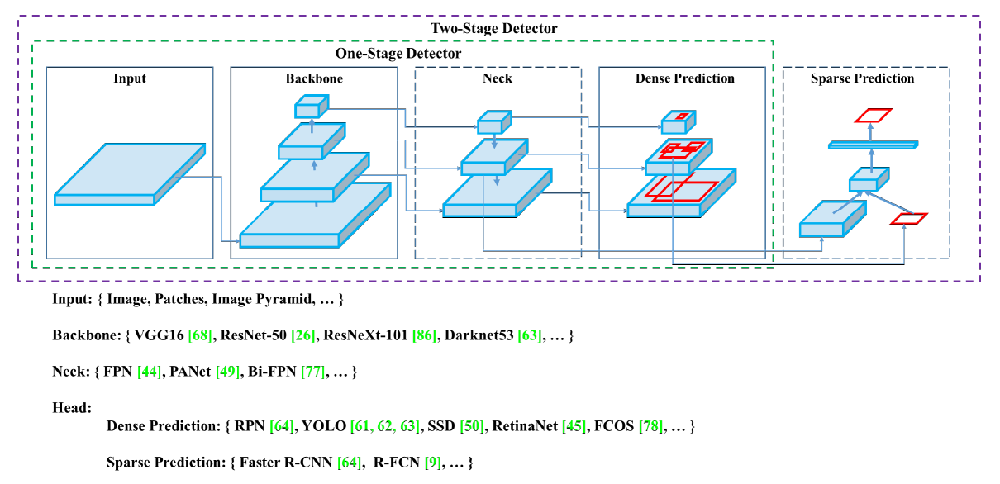

* 절차\
input(이미지) → CNN → FC(Fully Connected) → PT(Prediction Tensor) 를 반복

 (1) 이미지를 S X S의 그리드로 분할 (논문에서는 7*7)\
그리드마다 하나의 객체를 예측한다. 미리 설정해 둔 경계를 통해서 객체의 위치와 크기를 파악한다. 여러 객체가 한 셀에 있으면 탐지를 못할 수도 있다. 각 Grid cell 은 조건이 있다.
 - B개의 boundary boxes를 예측하고, 각 box는 하나의 box confidence score (신뢰도)을 가지고 있다.
    - 예측된 box 수에 관계 없이 단 하나의 객체만 탐지한다.
    - boundary box는 객체의 위치 (x,y), 객체의 크기 (w,h), box confidence score로 구성된다.
    - box confidence score는 box가 객체를 포함하고 있을 가능성을 반영한다.
 - C개의 conditional class probabilities를 예측한다.
    - 탐지된 객체가 어느 특정 클래스에 속하는 지에 대한 확률

 (2) 이미지 전체를 신경망에 넣고 특징 추출을 통해 예측 텐서(Prediction Tensor) 생성
    - S * S * (B*5 +C)
    - 7x7 grids, 2 boundary boxes, 20 classes = 7* 7 * 30
    - 이제 YOLO는 7730 텐서를 예측하는 CNN 네트워크를 구축해야한다.

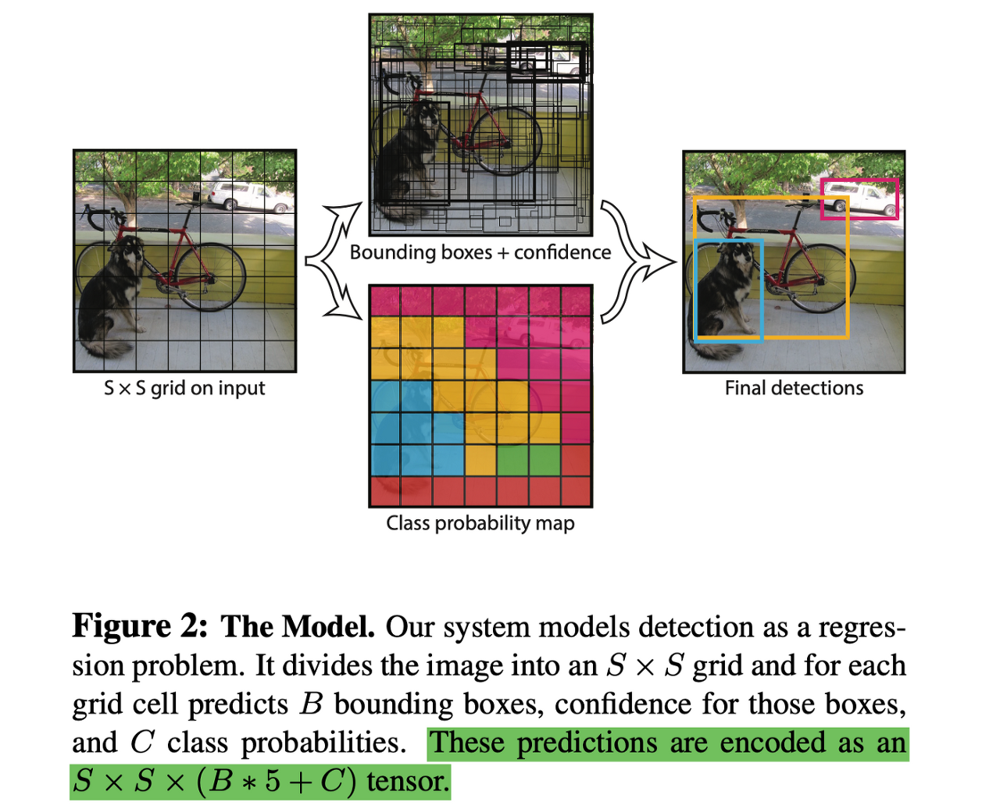

### YOLO Backbone

- 백본 모델(backbone model) 기반

- 특징 추출기(Feature Extractor)라고도 불림

- YOLO는 자체 맞춤 아키텍쳐 사용

- 어떤 특징 추출기 아키텍쳐를 사용했는지에 따라 성능 달라짐

  <img src="https://www.researchgate.net/publication/335865923/figure/fig1/AS:804106595758082@1568725360777/Structure-detail-of-YOLOv3It-uses-Darknet-53-as-the-backbone-network-and-uses-three.jpg">

  <sub>[이미지 출처] https://www.researchgate.net/figure/Structure-detail-of-YOLOv3It-uses-Darknet-53-as-the-backbone-network-and-uses-three_fig1_335865923</sub>

- 마지막 계층은 크기가 $w \times h \times D$인 특징 볼륨 출력

- $w \times h $는 그리드의 크기이고, $D$는 특징 볼륨 깊이


### YOLO 계층 출력

- 마지막 계층 출력은 w x h x M 행렬
  - M = B x (C + 5)
    - B : 그리드 셀당 경계 상자 개수
    - C : 클래스 개수
  - 클래스 개수에 5를 더한 이유는 해당 값 만큼의 숫자를 예측해야 함
    - tx, ty는 중심 좌표
    - tw, th는 너비와 높이
    - c는 신뢰도
    - p1,p2,...pC는 클래스 1,2,..C의 객체를 포함할 확률
    - Objectness Score : 바운딩 박스에 객체가 포함될 있을 확률
  <br>

  <img src="https://www.researchgate.net/profile/Thi_Le3/publication/337705605/figure/fig3/AS:831927326089217@1575358339500/Structure-of-one-output-cell-in-YOLO.ppm">

  <sub>[이미지 출처] https://www.researchgate.net/figure/Structure-of-one-output-cell-in-YOLO_fig3_337705605</sub>


### 앵커 박스(Anchor Box)

- YOLOv2에서 도입

- 사전 정의된 상자(prior box)

- 객체에 가장 근접한 앵커 박스를 맞추고 신경망을 사용해 앵커 박스의 크기를 조정하는 과정때문에 $t_x, t_y, t_w, t_h$이 필요

- 앵커 박스의 아웃풋이 바운딩 박스

  <img src="https://kr.mathworks.com/help/vision/ug/ssd_detection.png">

  <sub>[이미지 출처] https://kr.mathworks.com/help/vision/ug/getting-started-with-yolo-v2.html</sub>


In [ ]:
import torch

print("Torch version:{}".format(torch.__version__))

Torch version:1.13.0+cu116


#### * COCO Dataset 을 학습한 YOLO v3 (using PyTorch)
- pytorch tutorials : https://tutorials.pytorch.kr/
- yolov3 pytorch 버전 : https://github.com/ultralytics/yolov3
- yolov5 : https://github.com/ultralytics/yolov5

In [ ]:
from matplotlib import text
!git clone https://github.com/ultralytics/yolov3 
%cd yolov3/
%pip install -qr requirements.txt

import yaml
import torch
from IPython.display import Image, clear_output

#print(f"Torch:{torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda. is _available() else 'CPU'})")

Cloning into 'yolov3'...
remote: Enumerating objects: 10079, done.
remote: Counting objects: 100% (62/62), done.
remote: Compressing objects: 100% (48/48), done.
remote: Total 10079 (delta 29), reused 33 (delta 14), pack-reused 10017
Receiving objects: 100% (10079/10079), 9.39 MiB | 21.76 MiB/s, done.
Resolving deltas: 100% (6787/6787), done.
/content/yolov3
     |████████████████████████████████| 1.6 MB 14.0 MB/s 


In [ ]:
!cat requirements.txt

# YOLOv3 requirements
# Usage: pip install -r requirements.txt

# Base ----------------------------------------
matplotlib>=3.2.2
numpy>=1.18.5
opencv-python>=4.1.1
Pillow>=7.1.2
PyYAML>=5.3.1
requests>=2.23.0
scipy>=1.4.1
torch>=1.7.0  # see https://pytorch.org/get-started/locally/ (recommended)
torchvision>=0.8.1
tqdm>=4.64.0
# protobuf<=3.20.1  # https://github.com/ultralytics/yolov5/issues/8012

# Logging -------------------------------------
tensorboard>=2.4.1
# clearml
# comet

# Plotting ------------------------------------
pandas>=1.1.4
seaborn>=0.11.0

# Export --------------------------------------
# coremltools>=6.0  # CoreML export
# onnx>=1.9.0  # ONNX export
# onnx-simplifier>=0.4.1  # ONNX simplifier
# nvidia-pyindex  # TensorRT export
# nvidia-tensorrt  # TensorRT export
# scikit-learn<=1.1.2  # CoreML quantization
# tensorflow>=2.4.1  # TF exports (-cpu, -aarch64, -macos)
# tensorflowjs>=3.9.0  # TF.js export
# openvino-dev  # OpenVINO export

# Deploy ----------------

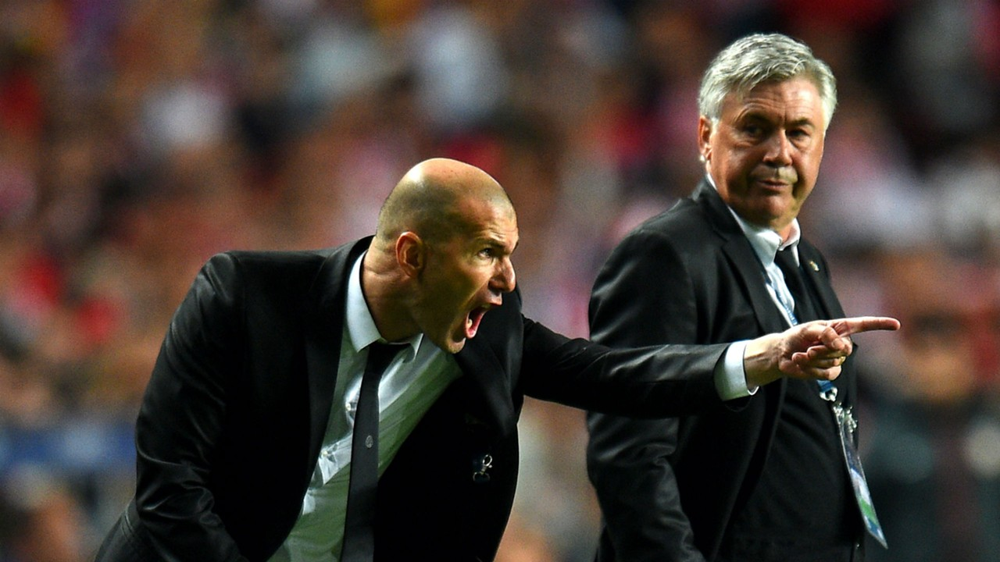

In [ ]:
Image(filename='/content/yolov3/data/images/zidane.jpg', width=600)

In [ ]:
# 가중치 학습? (이미지 640, 신뢰도 0.25 이상)
!python detect.py --weights yolov3.pt --img 640 --conf 0.25 --source data/images/

detect: weights=['yolov3.pt'], source=data/images/, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv3 🚀 v9.6.0-31-g91b0406 torch 1.13.0+cu116 CUDA:0 (Tesla T4, 15110MiB)

100% 119M/119M [00:06<00:00, 19.7MB/s]

Fusing layers... 
Model Summary: 261 layers, 61922845 parameters, 0 gradients
image 1/2 /content/yolov3/data/images/bus.jpg: 640x480 4 persons, 1 bicycle, 1 bus, Done. (0.053s)
image 2/2 /content/yolov3/data/images/zidane.jpg: 384x640 2 persons, 2 ties, Done. (0.047s)
Speed: 0.6ms pre-process, 50.1ms inference, 17.6ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp


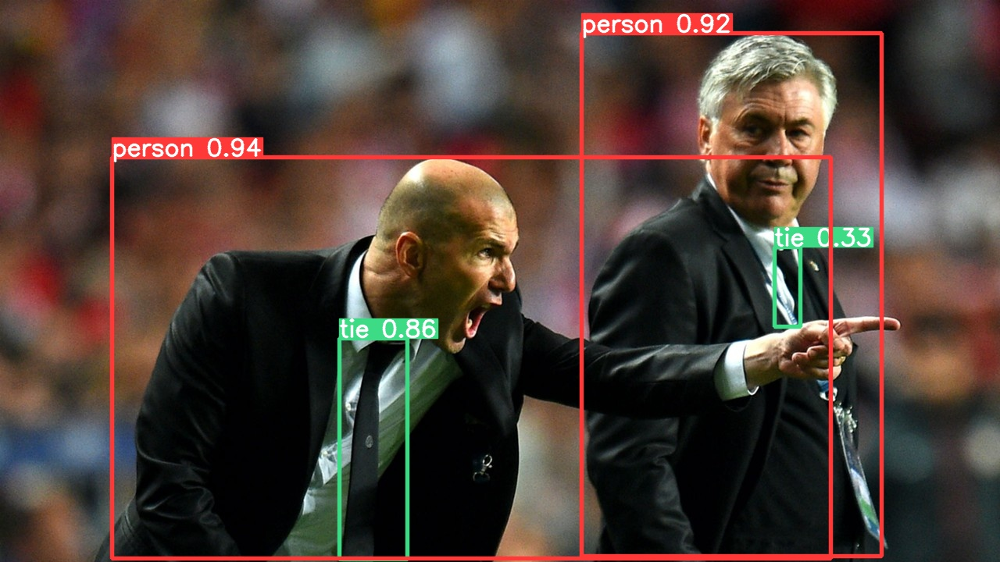

In [ ]:
Image(filename='/content/yolov3/runs/detect/exp/zidane.jpg', width=600)

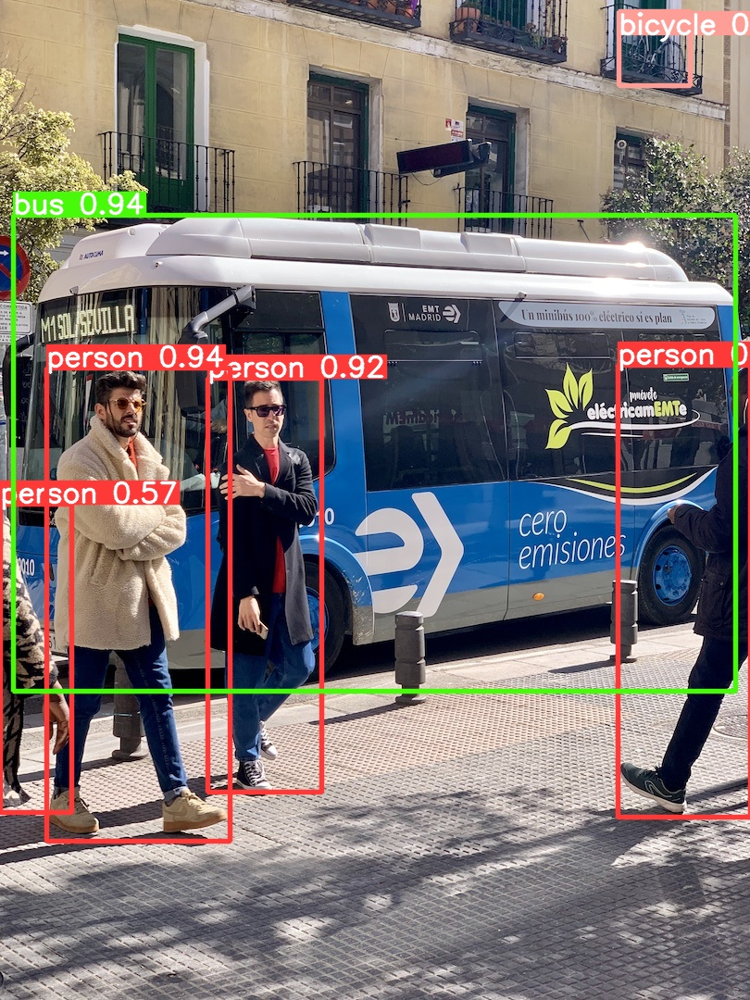

In [ ]:
Image(filename='/content/yolov3/runs/detect/exp/bus.jpg', width=600)

#### * YOLO v5
https://github.com/ultralytics/yolov5.git

In [ ]:
%cd /content
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
%pip install -qr requirements.txt

import torch
from IPython.display import Image, clear_output

/content
Cloning into 'yolov5'...
remote: Enumerating objects: 14906, done.
remote: Counting objects: 100% (26/26), done.
remote: Compressing objects: 100% (24/24), done.
remote: Total 14906 (delta 11), reused 12 (delta 2), pack-reused 14880
Receiving objects: 100% (14906/14906), 13.92 MiB | 22.60 MiB/s, done.
Resolving deltas: 100% (10258/10258), done.
/content/yolov5
     |████████████████████████████████| 184 kB 15.0 MB/s 
     |████████████████████████████████| 62 kB 1.7 MB/s 


In [ ]:
# detecting
!python detect.py --weights yolov5s.pt --img 640 --conf 0.25 --source data/images/

detect: weights=['yolov5s.pt'], source=data/images/, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-53-g65071da Python-3.8.16 torch-1.13.0+cu116 CUDA:0 (Tesla T4, 15110MiB)

100% 14.1M/14.1M [00:00<00:00, 297MB/s]

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients
image 1/2 /content/yolov5/data/images/bus.jpg: 640x480 4 persons, 1 bus, 11.7ms
image 2/2 /content/yolov5/data/images/zidane.jpg: 384x640 2 persons, 2 ties, 13.7ms
Speed: 0.4ms pre-process, 12.7ms inference, 1.2ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp


In [ ]:
!pwd

/content/yolov5


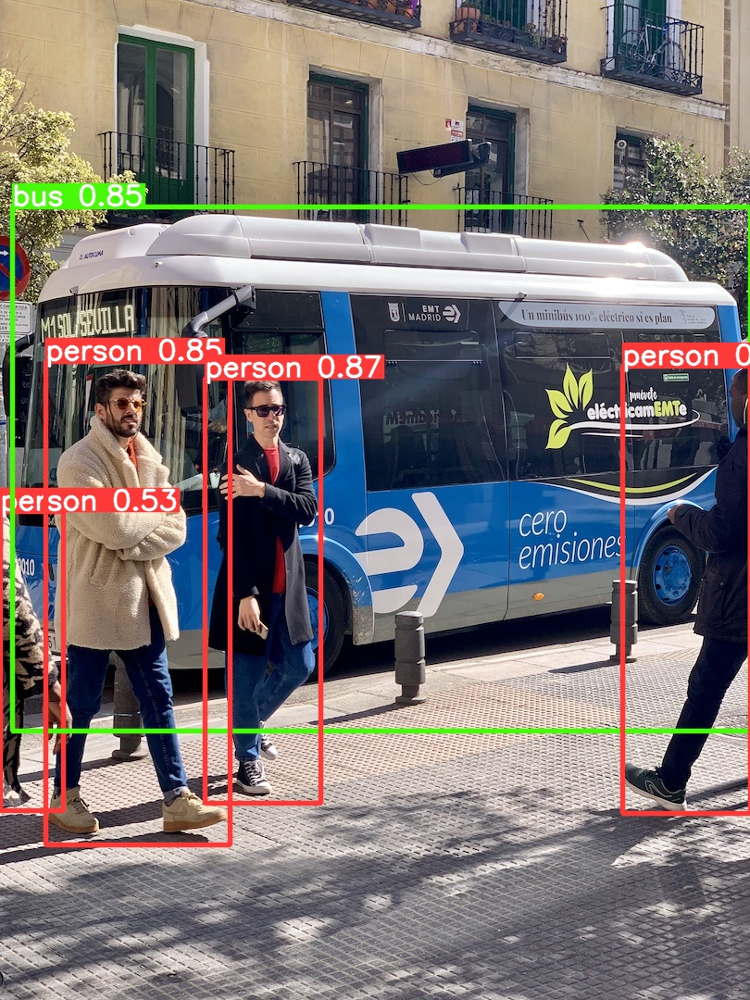

In [ ]:
Image(filename='/content/yolov5/runs/detect/exp/bus.jpg', width=600)

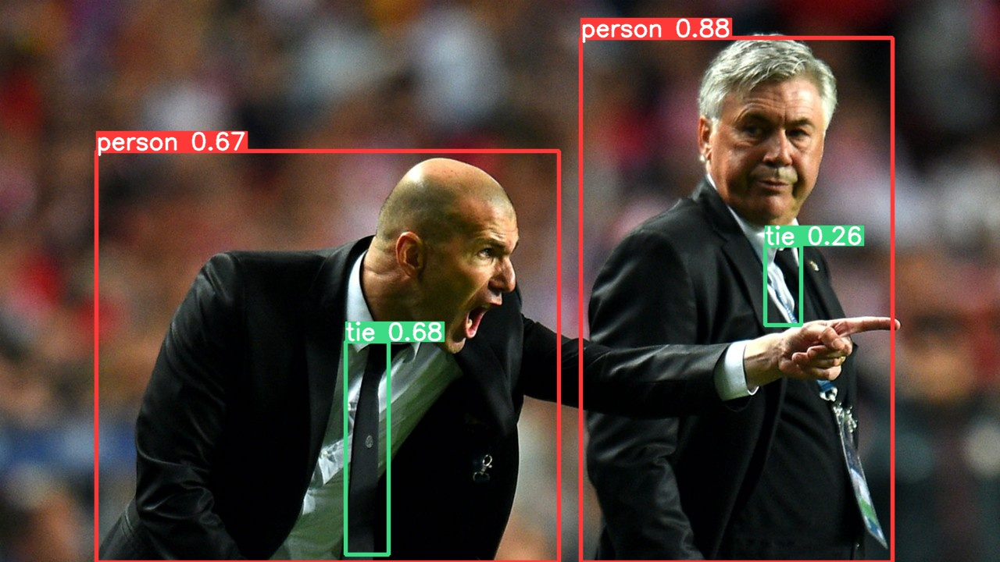

In [ ]:
Image(filename='/content/yolov5/runs/detect/exp/zidane.jpg', width=600)

## 특정 목적에 맞게 훈련하여 detecting

* 데이터셋 다운로드
 - 포트홀 데이터셋 : https://public.roboflow.com/object-detection/pothole
 - url copy : https://public.roboflow.com/ds/SmYfm04u10?key=DreIZLpvYf

In [ ]:
# 디렉토리 변경
%mkdir /content/yolov5/pothole
%cd /content/yolov5/pothole

/content/yolov5/pothole


In [ ]:
# 변경된 디렉토리 확인
!pwd

/content/yolov5/pothole


In [ ]:
# curl : 커맨드 아린용 데이터 전송 도구
# -L 옵션을 사용하여 HTTP 위치 헤더를 따르도록 함
# (리다이렉션을 따르도록 curl 을 사용할 수 있음)
!curl -L "https://public.roboflow.com/ds/SmYfm04u10?key=DreIZLpvYf" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   901  100   901    0     0   2415      0 --:--:-- --:--:-- --:--:--  2409
100 46.0M  100 46.0M    0     0  16.7M      0  0:00:02  0:00:02 --:--:-- 29.7M
Archive:  roboflow.zip
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
 extracting: data.yaml               
   creating: test/
   creating: test/images/
 extracting: test/images/img-105_jpg.rf.3fe9dff3d1631e79ecb480ff403bcb86.jpg  
 extracting: test/images/img-107_jpg.rf.2e40485785f6e5e2efec404301b235c2.jpg  
 extracting: test/images/img-146_jpg.rf.61be25b3053a51f622a244980545df2b.jpg  
 extracting: test/images/img-161_jpg.rf.211541e7178a4a93ec0680f26b905427.jpg  
 extracting: test/images/img-168_jpg.rf.af3590e07b06b43e91fa53990ff94af3.jpg  
 extracting: test/images/img-179_jpg.rf.8632eb0d9b75fefe144829e67b75015a.jpg  
 extracting: test/images/img